<a href="https://colab.research.google.com/github/hazhalim/exploring-sdg7-insights/blob/main/Exploring_SDG_7_Insights.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Exploring Sustainable Insights into Clean Energy: Fuel Access and Energy Efficiency**
# **SDG 7: Affordable and Clean Energy**


# Loading of Dataset

In [ ]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

In [ ]:
def show_all_rows(option):
    pd.set_option('display.max_rows', None if option else 50)
    pd.set_option('display.max_columns', None if option else 10)

In [ ]:
dataset = pd.read_csv('global-data-on-sustainable-energy.csv', thousands=',')

In [ ]:
pd.set_option('display.max_rows', 50)

In [ ]:
dataset.head(15)

,Entity,Year,Access to electricity (% of population),Access to clean fuels for cooking,Renewable-electricity-generating-capacity-per-capita,...,gdp_per_capita,Density (P/Km2),Land Area(Km2),Latitude,Longitude
0,Afghanistan,2000,1.613591,6.20,9.22,...,NaN,60.0,652230.0,33.93911,67.709953
1,Afghanistan,2001,4.074574,7.20,8.86,...,NaN,60.0,652230.0,33.93911,67.709953
2,Afghanistan,2002,9.409158,8.20,8.47,...,179.426579,60.0,652230.0,33.93911,67.709953
3,Afghanistan,2003,14.738506,9.50,8.09,...,190.683814,60.0,652230.0,33.93911,67.709953
4,Afghanistan,2004,20.064968,10.90,7.75,...,211.382074,60.0,652230.0,33.93911,67.709953
5,Afghanistan,2005,25.390894,12.20,7.51,...,242.031313,60.0,652230.0,33.93911,67.709953
6,Afghanistan,2006,30.718690,13.85,7.40,...,263.733602,60.0,652230.0,33.93911,67.709953
7,Afghanistan,2007,36.051010,15.30,7.25,...,359.693158,60.0,652230.0,33.93911,67.709953
8,Afghanistan,2008,42.400000,16.70,7.49,...,364.663542,60.0,652230.0,33.93911,67.709953
9,Afghanistan,2009,46.740050,18.40,7.50,...,437.268740,60.0,652230.0,33.93911,67.709953


## Initial Description of Dataset

In [ ]:
dataset.describe()

,Year,Access to electricity (% of population),Access to clean fuels for cooking,Renewable-electricity-generating-capacity-per-capita,Financial flows to developing countries (US $),...,gdp_per_capita,Density (P/Km2),Land Area(Km2),Latitude,Longitude
count,3649.000000,3639.000000,3480.000000,2718.000000,1.560000e+03,...,3367.000000,3648.000000,3.648000e+03,3648.000000,3648.000000
mean,2010.038367,78.933702,63.255287,113.137498,9.422400e+07,...,13283.774348,223.573191,6.332135e+05,18.246388,14.822695
std,6.054228,30.275541,39.043658,244.167256,2.981544e+08,...,19709.866716,683.463448,1.585519e+06,24.159232,66.348148
min,2000.000000,1.252269,0.000000,0.000000,0.000000e+00,...,111.927225,2.000000,2.100000e+01,-40.900557,-175.198242
25%,2005.000000,59.800890,23.175000,3.540000,2.600000e+05,...,1337.813437,34.000000,2.571300e+04,3.202778,-11.779889
50%,2010.000000,98.361570,83.150000,32.910000,5.665000e+06,...,4578.633208,87.000000,1.176000e+05,17.189877,19.145136
75%,2015.000000,100.000000,100.000000,112.210000,5.534750e+07,...,15768.615365,219.000000,5.131200e+05,38.969719,46.199616
max,2020.000000,100.000000,100.000000,3060.190000,5.202310e+09,...,123514.196700,8358.000000,9.984670e+06,64.963051,178.065032


## Data Types of Columns

In [ ]:
dataset.dtypes

,0
Entity,object
Year,int64
Access to electricity (% of population),float64
Access to clean fuels for cooking,float64
Renewable-electricity-generating-capacity-per-capita,float64
Financial flows to developing countries (US $),float64
Renewable energy share in the total final energy consumption (%),float64
Electricity from fossil fuels (TWh),float64
Electricity from nuclear (TWh),float64
Electricity from renewables (TWh),float64


In [ ]:
dataset['Entity'].unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba',
       'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain',
       'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin',
       'Bermuda', 'Bhutan', 'Bosnia and Herzegovina', 'Botswana',
       'Brazil', 'Bulgaria', 'Burkina Faso', 'Burundi', 'Cambodia',
       'Cameroon', 'Canada', 'Cayman Islands', 'Central African Republic',
       'Chad', 'Chile', 'China', 'Colombia', 'Comoros', 'Congo',
       'Costa Rica', 'Croatia', 'Cuba', 'Cyprus', 'Czechia', 'Denmark',
       'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia',
       'Eswatini', 'Ethiopia', 'Fiji', 'Finland', 'France',
       'French Guiana', 'Gabon', 'Gambia', 'Georgia', 'Germany', 'Ghana',
       'Greece', 'Grenada', 'Guatemala', 'Guinea', 'Guinea-Bissau',
       'Guyana', 'Haiti', 'Honduras', 'Hungary', 'Icelan

In [ ]:
country_to_region_mapping = {
    'Afghanistan': 'Southern Asia',
    'Albania': 'Southern Europe',
    'Algeria': 'Northern Africa',
    'Angola': 'Middle Africa',
    'Antigua and Barbuda': 'Carribean',
    'Argentina': 'South America',
    'Armenia': 'Western Asia',
    'Aruba': 'Carribean',
    'Australia': 'Australia and New Zealand',
    'Austria': 'Western Europe',
    'Azerbaijan': 'Western Asia',
    'Bahamas': 'Carribean',
    'Bahrain': 'Western Asia',
    'Bangladesh': 'Southern Asia',
    'Barbados': 'Carribean',
    'Belarus': 'Eastern Europe',
    'Belgium': 'Western Europe',
    'Belize': 'Central America',
    'Benin': 'Western Africa',
    'Bermuda': 'Northern America',
    'Bhutan': 'Southern Asia',
    'Bosnia and Herzegovina': 'Southern Europe',
    'Botswana': 'Southern Africa',
    'Brazil': 'South America',
    'Bulgaria': 'Eastern Europe',
    'Burkina Faso': 'Western Africa',
    'Burundi': 'Eastern Africa',
    'Cambodia': 'Southeastern Asia',
    'Cameroon': 'Middle Africa',
    'Canada': 'Northern America',
    'Cayman Islands': 'Carribean',
    'Central African Republic': 'Middle Africa',
    'Chad': 'Middle Africa',
    'Chile': 'South America',
    'China': 'Eastern Asia',
    'Colombia': 'South America',
    'Comoros': 'Eastern Africa',
    'Congo': 'Middle Africa',
    'Costa Rica': 'Central America',
    'Croatia': 'Southern Europe',
    'Cuba': 'Carribean',
    'Cyprus': 'Western Asia',
    'Czechia': 'Eastern Europe',
    'Denmark': 'Northern Europe',
    'Djibouti': 'Eastern Africa',
    'Dominica': 'Carribean',
    'Dominican Republic': 'Carribean',
    'Ecuador': 'South America',
    'Egypt': 'Northern Africa',
    'El Salvador': 'Central America',
    'Equatorial Guinea': 'Middle Africa',
    'Eritrea': 'Eastern Africa',
    'Estonia': 'Northern Europe',
    'Eswatini': 'Southern Africa',
    'Ethiopia': 'Eastern Africa',
    'Fiji': 'Melanesia',
    'Finland': 'Northern Europe',
    'France': 'Western Europe',
    'Gabon': 'Middle Africa',
    'Gambia': 'Western Africa',
    'Georgia': 'Western Asia',
    'Germany': 'Western Europe',
    'Ghana': 'Western Africa',
    'Greece': 'Southern Europe',
    'Grenada': 'Carribean',
    'Guatemala': 'Central America',
    'Guinea': 'Western Africa',
    'Guinea-Bissau': 'Western Africa',
    'Guyana': 'South America',
    'Haiti': 'Carribean',
    'Honduras': 'Central America',
    'Hungary': 'Eastern Europe',
    'Iceland': 'Northern Europe',
    'India': 'Southern Asia',
    'Indonesia': 'Southeastern Asia',
    'Iraq': 'Western Asia',
    'Ireland': 'Northern Europe',
    'Israel': 'Western Asia',
    'Italy': 'Southern Europe',
    'Jamaica': 'Carribean',
    'Japan': 'Eastern Asia',
    'Jordan': 'Western Asia',
    'Kazakhstan': 'Central Asia',
    'Kenya': 'Eastern Africa',
    'Kiribati': 'Micronesia',
    'Kuwait': 'Western Asia',
    'Kyrgyzstan': 'Central Asia',
    'Latvia': 'Northern Europe',
    'Lebanon': 'Western Asia',
    'Lesotho': 'Southern Africa',
    'Liberia': 'Western Africa',
    'Libya': 'Northern Africa',
    'Lithuania': 'Northern Europe',
    'Luxembourg': 'Western Europe',
    'Madagascar': 'Eastern Africa',
    'Malawi': 'Eastern Africa',
    'Malaysia': 'Southeastern Asia',
    'Maldives': 'Southern Asia',
    'Mali': 'Western Africa',
    'Malta': 'Southern Europe',
    'Mauritania': 'Western Africa',
    'Mauritius': 'Eastern Africa',
    'Mexico': 'Central America',
    'Mongolia': 'Eastern Asia',
    'Montenegro': 'Southern Europe',
    'Morocco': 'Northern Africa',
    'Mozambique': 'Eastern Africa',
    'Myanmar': 'Southeastern Asia',
    'Namibia': 'Southern Africa',
    'Nauru': 'Micronesia',
    'Nepal': 'Southern Asia',
    'Netherlands': 'Western Europe',
    'New Caledonia': 'Melanesia',
    'New Zealand': 'Australia and New Zealand',
    'Nicaragua': 'Central America',
    'Niger': 'Western Africa',
    'Nigeria': 'Western Africa',
    'North Macedonia': 'Southern Europe',
    'Norway': 'Northern Europe',
    'Oman': 'Western Asia',
    'Pakistan': 'Southern Asia',
    'Panama': 'Central America',
    'Papua New Guinea': 'Melanesia',
    'Paraguay': 'South America',
    'Peru': 'South America',
    'Philippines': 'Southeastern Asia',
    'Poland': 'Eastern Europe',
    'Portugal': 'Southern Europe',
    'Puerto Rico': 'Carribean',
    'Qatar': 'Western Asia',
    'Romania': 'Eastern Europe',
    'Rwanda': 'Eastern Africa',
    'Saint Kitts and Nevis': 'Carribean',
    'Saint Lucia': 'Carribean',
    'Saint Vincent and the Grenadines': 'Carribean',
    'Samoa': 'Polynesia',
    'Sao Tome and Principe': 'Middle Africa',
    'Saudi Arabia': 'Western Asia',
    'Senegal': 'Western Africa',
    'Serbia': 'Southern Europe',
    'Seychelles': 'Eastern Africa',
    'Sierra Leone': 'Western Africa',
    'Singapore': 'Southeastern Asia',
    'Slovakia': 'Eastern Europe',
    'Slovenia': 'Southern Europe',
    'Solomon Islands': 'Melanesia',
    'Somalia': 'Eastern Africa',
    'South Africa': 'Southern Africa',
    'South Sudan': 'Eastern Africa',
    'Spain': 'Southern Europe',
    'Sri Lanka': 'Southern Asia',
    'Sudan': 'Northern Africa',
    'Suriname': 'South America',
    'Sweden': 'Northern Europe',
    'Switzerland': 'Western Europe',
    'Tajikistan': 'Central Asia',
    'Thailand': 'Southeastern Asia',
    'Togo': 'Western Africa',
    'Tonga': 'Polynesia',
    'Trinidad and Tobago': 'Carribean',
    'Tunisia': 'Northern Africa',
    'Turkey': 'Western Asia',
    'Turkmenistan': 'Central Asia',
    'Tuvalu': 'Polynesia',
    'Uganda': 'Eastern Africa',
    'Ukraine': 'Eastern Europe',
    'United Arab Emirates': 'Western Asia',
    'United Kingdom': 'Northern Europe',
    'United States': 'Northern America',
    'Uruguay': 'South America',
    'Uzbekistan': 'Central Asia',
    'Vanuatu': 'Melanesia',
    'Yemen': 'Western Asia',
    'Zambia': 'Eastern Africa',
    'Zimbabwe': 'Eastern Africa'
}

In [ ]:
dataset.insert(loc = dataset.columns.get_loc('Entity') + 1, column = 'region', value = dataset['Entity'].map(country_to_region_mapping))

dataset

,Entity,region,Year,Access to electricity (% of population),Access to clean fuels for cooking,...,gdp_per_capita,Density (P/Km2),Land Area(Km2),Latitude,Longitude
0,Afghanistan,Southern Asia,2000,1.613591,6.2,...,NaN,60.0,652230.0,33.939110,67.709953
1,Afghanistan,Southern Asia,2001,4.074574,7.2,...,NaN,60.0,652230.0,33.939110,67.709953
2,Afghanistan,Southern Asia,2002,9.409158,8.2,...,179.426579,60.0,652230.0,33.939110,67.709953
3,Afghanistan,Southern Asia,2003,14.738506,9.5,...,190.683814,60.0,652230.0,33.939110,67.709953
4,Afghanistan,Southern Asia,2004,20.064968,10.9,...,211.382074,60.0,652230.0,33.939110,67.709953
...,...,...,...,...,...,...,...,...,...,...,...
3644,Zimbabwe,Eastern Africa,2016,42.561730,29.8,...,1464.588957,38.0,390757.0,-19.015438,29.154857
3645,Zimbabwe,Eastern Africa,2017,44.178635,29.8,...,1235.189032,38.0,390757.0,-19.015438,29.154857
3646,Zimbabwe,Eastern Africa,2018,45.572647,29.9,...,1254.642265,38.0,390757.0,-19.015438,29.154857
3647,Zimbabwe,Eastern Africa,2019,46.781475,30.1,...,1316.740657,38.0,390757.0,-19.015438,29.154857


# Data Preprocessing

### Intitial Boxplots

<Axes: >

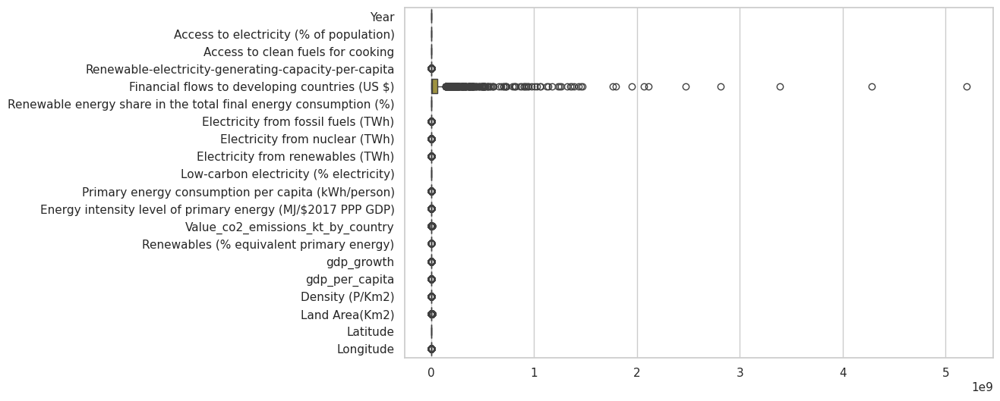

In [ ]:
# Create box plots for each column in the dataset
numerical_dataset = dataset.select_dtypes(include = ['float64', 'int64'])
sns.boxplot(data = dataset[numerical_dataset.columns], orient = 'h')

<Axes: >

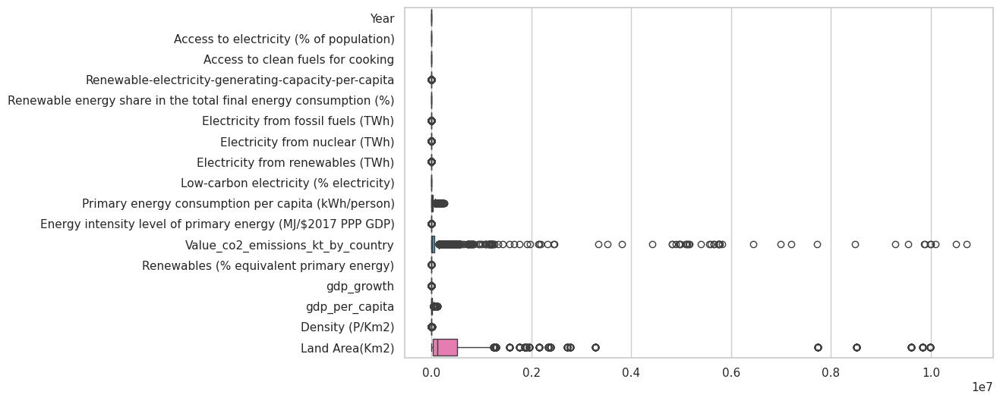

In [ ]:
columns_to_exclude = ['Latitude', 'Longitude', 'Financial flows to developing countries (US $)']
dataset_excluded = dataset.drop(columns = columns_to_exclude)
numerical_dataset = dataset_excluded.select_dtypes(include = ['float64', 'int64'])
sns.boxplot(data = dataset_excluded[numerical_dataset.columns], orient = 'h')

### Column Skewness

In [ ]:
numerical_dataset = dataset.select_dtypes(include = ['float64', 'int64'])
print(numerical_dataset.skew())

Year                                                                -0.009142
Access to electricity (% of population)                             -1.205845
Access to clean fuels for cooking                                   -0.508054
Renewable-electricity-generating-capacity-per-capita                 5.366933
Financial flows to developing countries (US $)                       8.388252
Renewable energy share in the total final energy consumption (%)     0.670873
Electricity from fossil fuels (TWh)                                  9.396760
Electricity from nuclear (TWh)                                       8.565198
Electricity from renewables (TWh)                                   11.057606
Low-carbon electricity (% electricity)                               0.506052
Primary energy consumption per capita (kWh/person)                   2.651621
Energy intensity level of primary energy (MJ/$2017 PPP GDP)          2.589086
Value_co2_emissions_kt_by_country                               

### Renaming Columns

In [ ]:
# Remapping column names for better accessibility
column_rename_mapping = {
    'Entity': 'country',
    'Year': 'year',
    'Access to electricity (% of population)': 'access_elec_pct',
    'Access to clean fuels for cooking': 'access_clean_fuel_cook',
    'Renewable-electricity-generating-capacity-per-capita': 'renewable_elec_gen_cap',
    'Financial flows to developing countries (US $)': 'financial_flow_developing_country',
    'Renewable energy share in the total final energy consumption (%)': 'renew_energy_share_total_energy_consum_pct',
    'Electricity from fossil fuels (TWh)': 'elec_fossil_fuel',
    'Electricity from nuclear (TWh)': 'elec_nuclear',
    'Electricity from renewables (TWh)': 'elec_renewables',
    'Low-carbon electricity (% electricity)': 'low_carbon_elec_pct',
    'Primary energy consumption per capita (kWh/person)': 'primary_energy_consum_per_capita',
    'Energy intensity level of primary energy (MJ/$2017 PPP GDP)': 'primary_energy_intensity',
    'Value_co2_emissions_kt_by_country': 'co2_emissions',
    'Renewables (% equivalent primary energy)': 'renewables_primary_energy_pct',
    'gdp_growth': 'gdp_growth',
    'gdp_per_capita': 'gdp_per_capita',
    'Density (P/Km2)': 'population_density',
    'Land Area(Km2)': 'land_area',
    'Latitude': 'latitude',
    'Longitude': 'longitude'
}

# Renaming columns in the dataset
dataset.rename(columns = column_rename_mapping, inplace = True)

dataset

,country,region,year,access_elec_pct,access_clean_fuel_cook,...,gdp_per_capita,population_density,land_area,latitude,longitude
0,Afghanistan,Southern Asia,2000,1.613591,6.2,...,NaN,60.0,652230.0,33.939110,67.709953
1,Afghanistan,Southern Asia,2001,4.074574,7.2,...,NaN,60.0,652230.0,33.939110,67.709953
2,Afghanistan,Southern Asia,2002,9.409158,8.2,...,179.426579,60.0,652230.0,33.939110,67.709953
3,Afghanistan,Southern Asia,2003,14.738506,9.5,...,190.683814,60.0,652230.0,33.939110,67.709953
4,Afghanistan,Southern Asia,2004,20.064968,10.9,...,211.382074,60.0,652230.0,33.939110,67.709953
...,...,...,...,...,...,...,...,...,...,...,...
3644,Zimbabwe,Eastern Africa,2016,42.561730,29.8,...,1464.588957,38.0,390757.0,-19.015438,29.154857
3645,Zimbabwe,Eastern Africa,2017,44.178635,29.8,...,1235.189032,38.0,390757.0,-19.015438,29.154857
3646,Zimbabwe,Eastern Africa,2018,45.572647,29.9,...,1254.642265,38.0,390757.0,-19.015438,29.154857
3647,Zimbabwe,Eastern Africa,2019,46.781475,30.1,...,1316.740657,38.0,390757.0,-19.015438,29.154857


In [ ]:
dataset = dataset[dataset['country'] != 'French Guiana']

### Best Action to Address Column Missing Values

In [ ]:
# Count missing values
missing_values_count = dataset.isnull().sum()

# Calculate percentage of data missing
missing_percentage = (missing_values_count / len(dataset)) * 100

# Define function to state action based on missing percentage
def best_action(percentage):
    if percentage == 0:
        return "No action needed"
    elif percentage <= 5:
        return "Impute (mean/median)"
    elif percentage <= 25:
        return "Consider imputation or flagging"
    elif percentage <= 50:
        return "Consider dropping or selective imputation"
    else:
        return "Drop unless the feature is critical"

# Create dataset with all details
missing_summary = pd.DataFrame({
    'Missing Count': missing_values_count,
    'Missing %': missing_percentage.round(2),
    'Best Action': missing_percentage.apply(best_action)
})

# Display summary sorted by % missing
print("Missing Value Summary:\n")
print(missing_summary.sort_values(by = "Missing %", ascending = False))


Missing Value Summary:

                                            Missing Count  Missing %  \
renewables_primary_energy_pct                        2136      58.55   
financial_flow_developing_country                    2088      57.24   
renewable_elec_gen_cap                                931      25.52   
co2_emissions                                         427      11.71   
gdp_growth                                            316       8.66   
gdp_per_capita                                        281       7.70   
primary_energy_intensity                              206       5.65   
renew_energy_share_total_energy_consum_pct            194       5.32   
access_clean_fuel_cook                                168       4.61   
elec_nuclear                                          126       3.45   
low_carbon_elec_pct                                    42       1.15   
elec_fossil_fuel                                       21       0.58   
elec_renewables                         

## Checking for Duplicate Rows

In [ ]:
# Count the number of duplicate rows
duplicate_count = dataset.duplicated().sum()
print("Count of Duplicate Rows:")
print(duplicate_count)

Count of Duplicate Rows:
0


## Dropping Columns with Too Many Missing Values

In [ ]:
dataset = dataset.drop(columns = ['renewables_primary_energy_pct', 'financial_flow_developing_country', 'renewable_elec_gen_cap'])

In [ ]:
dataset

,country,region,year,access_elec_pct,access_clean_fuel_cook,...,gdp_per_capita,population_density,land_area,latitude,longitude
0,Afghanistan,Southern Asia,2000,1.613591,6.2,...,NaN,60.0,652230.0,33.939110,67.709953
1,Afghanistan,Southern Asia,2001,4.074574,7.2,...,NaN,60.0,652230.0,33.939110,67.709953
2,Afghanistan,Southern Asia,2002,9.409158,8.2,...,179.426579,60.0,652230.0,33.939110,67.709953
3,Afghanistan,Southern Asia,2003,14.738506,9.5,...,190.683814,60.0,652230.0,33.939110,67.709953
4,Afghanistan,Southern Asia,2004,20.064968,10.9,...,211.382074,60.0,652230.0,33.939110,67.709953
...,...,...,...,...,...,...,...,...,...,...,...
3644,Zimbabwe,Eastern Africa,2016,42.561730,29.8,...,1464.588957,38.0,390757.0,-19.015438,29.154857
3645,Zimbabwe,Eastern Africa,2017,44.178635,29.8,...,1235.189032,38.0,390757.0,-19.015438,29.154857
3646,Zimbabwe,Eastern Africa,2018,45.572647,29.9,...,1254.642265,38.0,390757.0,-19.015438,29.154857
3647,Zimbabwe,Eastern Africa,2019,46.781475,30.1,...,1316.740657,38.0,390757.0,-19.015438,29.154857


## Cleaning Missing Values in Columns

We define a generic function that can impute and flag values (missing and missing_all) and replace flagged rows with a sentinel value. Works if there is only one case happening of three possible cases: missing in front, missing in the back, and missing in the middle.

In [ ]:
def clean_generic(group, col_name, col_missing, sentinel_value):
  col = col_name
  group = group.sort_values('year')
  years = group['year']
  missing_mask = group[col].isna()

  # Flag all originally missing values
  group.loc[missing_mask, col_missing] = 1

  missing_all_string = f'{col_name}_missing_all'
  is_missing_all = missing_mask.all()
  group[missing_all_string] = int(is_missing_all)

  if is_missing_all:
    group[col] = sentinel_value
    return group

  # Identify positions of missing values
  missing_years = years[missing_mask]

  # If missing only at the start
  if missing_years.min() == years.min():
    group[col] = group[col].bfill() # Backfill with the first valid value

  # If missing only at the end
  elif missing_years.max() == years.max():
    group[col] = group[col].interpolate(method = 'linear', limit_direction = 'forward')
    group[col] = group[col].ffill() # Forwardfill with the last valid value

  # If missing in between
  else:
    group[col] = group[col].interpolate(method = 'linear', limit_direction = 'both')

  return group

### CO2 Emissions Cleaning

In [ ]:
print(dataset[['country', 'year', 'co2_emissions']])

          country  year  co2_emissions
0     Afghanistan  2000     760.000000
1     Afghanistan  2001     730.000000
2     Afghanistan  2002    1029.999971
3     Afghanistan  2003    1220.000029
4     Afghanistan  2004    1029.999971
...           ...   ...            ...
3644     Zimbabwe  2016   11020.000460
3645     Zimbabwe  2017   10340.000150
3646     Zimbabwe  2018   12380.000110
3647     Zimbabwe  2019   11760.000230
3648     Zimbabwe  2020            NaN

[3648 rows x 3 columns]


In [ ]:
dataset['co2_emissions_missing'] = 0

dataset = dataset.groupby('country').apply(clean_generic,
    col_name = 'co2_emissions',
    col_missing = 'co2_emissions_missing',
    sentinel_value = -999).reset_index(drop = True)

<ipython-input-157-2455891065>:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  dataset = dataset.groupby('country').apply(clean_generic,


In [ ]:
# missing_by_country = dataset.groupby("country")["co2_emissions"].apply(lambda x: x.isna().sum())

# total_by_country = dataset.groupby("country").size()

# missing_pct = (missing_by_country / total_by_country).reset_index(name = 'missing_pct')

# high_missing = missing_pct[missing_pct["missing_pct"] > 0.4]["country"]

# high_missing

In [ ]:
# # Get how many missing energy access values exist per high-missing country
# energy_cols = ['access_electricity_pct', 'access_clean_fuel_cook', 'renew_energy_share_total_energy_consum_pct']
# valid_energy_countries = dataset[dataset["country"].isin(high_missing)]
# valid_energy_countries = valid_energy_countries.groupby("country")[energy_cols].apply(lambda x: x.notna().mean())

# valid_energy_countries

In [ ]:
# def qualifies_for_interpolation(group):
#     missing_years = group[group['co2_emissions'].isna()]['year'].tolist()
#     if not missing_years:
#         return True  # No missing years at all
#     # All missing years must be between 2016 and 2020
#     return all(y >= 2016 for y in missing_years)

# # Get qualifying countries
# qualified_countries = (
#     dataset.groupby('country')
#     .apply(qualifies_for_interpolation)
# )

# # Extract countries where the function returned True
# qualified_countries = qualified_countries[qualified_countries].index.tolist()

# qualified_countries

In [ ]:
# def interpolate_if_qualified(group):
#     if group.name in qualified_countries:
#         group['co2_emissions'] = group['co2_emissions'].interpolate(method = 'linear', limit_direction = 'both')
#     return group

# dataset = dataset.groupby('country').apply(interpolate_if_qualified).reset_index(drop = True)

In [ ]:
# dataset['co2_emissions_missing'] = dataset['co2_emissions'].isna().astype(int)

# dataset['co2_emissions'] = dataset['co2_emissions'].fillna(-1)

# dataset[['country', 'year', 'co2_emissions', 'co2_emissions_missing']]

In [ ]:
dataset[['country', 'year', 'co2_emissions', 'co2_emissions_missing', 'co2_emissions_missing_all']]

,country,year,co2_emissions,co2_emissions_missing,co2_emissions_missing_all
0,Afghanistan,2000,760.000000,0,0
1,Afghanistan,2001,730.000000,0,0
2,Afghanistan,2002,1029.999971,0,0
3,Afghanistan,2003,1220.000029,0,0
4,Afghanistan,2004,1029.999971,0,0
...,...,...,...,...,...
3643,Zimbabwe,2016,11020.000460,0,0
3644,Zimbabwe,2017,10340.000150,0,0
3645,Zimbabwe,2018,12380.000110,0,0
3646,Zimbabwe,2019,11760.000230,0,0


In [ ]:
num_missing_co2_emissions = dataset['co2_emissions'].isna().sum()
print(f'Number of Missing Values for CO2 Emissions: {num_missing_co2_emissions}')

Number of Missing Values for CO2 Emissions: 0


Summary:

Missing from 2016-2020: Forwardfill with last valid value, flag 1 on co2_emissions_missing_all column

Missing all years: Impute with -1, flag 1 on co2_emissions_missing_all column

### GDP Growth Cleaning

In [ ]:
dataset[['country', 'year', 'gdp_growth']]

,country,year,gdp_growth
0,Afghanistan,2000,NaN
1,Afghanistan,2001,NaN
2,Afghanistan,2002,NaN
3,Afghanistan,2003,8.832278
4,Afghanistan,2004,1.414118
...,...,...,...
3643,Zimbabwe,2016,0.755869
3644,Zimbabwe,2017,4.709492
3645,Zimbabwe,2018,4.824211
3646,Zimbabwe,2019,-6.144236


In [ ]:
dataset['gdp_growth_missing'] = 0

dataset = dataset.groupby('country').apply(clean_generic,
    col_name = 'gdp_growth',
    col_missing = 'gdp_growth_missing',
    sentinel_value = -999).reset_index(drop = True)

<ipython-input-166-267846462>:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  dataset = dataset.groupby('country').apply(clean_generic,


In [ ]:
dataset[['country', 'year', 'gdp_growth', 'gdp_growth_missing', 'gdp_growth_missing_all']]

,country,year,gdp_growth,gdp_growth_missing,gdp_growth_missing_all
0,Afghanistan,2000,8.832278,1,0
1,Afghanistan,2001,8.832278,1,0
2,Afghanistan,2002,8.832278,1,0
3,Afghanistan,2003,8.832278,0,0
4,Afghanistan,2004,1.414118,0,0
...,...,...,...,...,...
3643,Zimbabwe,2016,0.755869,0,0
3644,Zimbabwe,2017,4.709492,0,0
3645,Zimbabwe,2018,4.824211,0,0
3646,Zimbabwe,2019,-6.144236,0,0


In [ ]:
num_missing_gdp_growth = dataset['gdp_growth'].isna().sum()
print(f'Number of Missing Values for GDP Growth: {num_missing_gdp_growth}')

Number of Missing Values for GDP Growth: 0


Summary:

Missing early years (2000-2006): backfill with most recent value, flag 1 on gdp_growth_missing

Missing in the middle: interpolate

Missing in the later years (2013-2020): forwardfill with latest value, flag 1 on gdp_growth_missing

Missing all values: impute sentinel value (-999) and flag 1 on gdp_growth_missing_all

### GDP per Capita Cleaning

In [ ]:
dataset[['country', 'year', 'gdp_per_capita']]

,country,year,gdp_per_capita
0,Afghanistan,2000,NaN
1,Afghanistan,2001,NaN
2,Afghanistan,2002,179.426579
3,Afghanistan,2003,190.683814
4,Afghanistan,2004,211.382074
...,...,...,...
3643,Zimbabwe,2016,1464.588957
3644,Zimbabwe,2017,1235.189032
3645,Zimbabwe,2018,1254.642265
3646,Zimbabwe,2019,1316.740657


In [ ]:
dataset['gdp_per_capita'].describe()

,gdp_per_capita
count,3367.000000
mean,13283.774348
std,19709.866716
min,111.927225
25%,1337.813437
50%,4578.633208
75%,15768.615365
max,123514.196700


In [ ]:
dataset['gdp_per_capita_missing'] = 0

dataset = dataset.groupby('country').apply(clean_generic,
    col_name = 'gdp_per_capita',
    col_missing = 'gdp_per_capita_missing',
    sentinel_value = -999).reset_index(drop = True)

<ipython-input-171-1588438521>:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  dataset = dataset.groupby('country').apply(clean_generic,


In [ ]:
dataset[['country', 'year', 'gdp_per_capita', 'gdp_per_capita_missing', 'gdp_per_capita_missing_all']]

,country,year,gdp_per_capita,gdp_per_capita_missing,gdp_per_capita_missing_all
0,Afghanistan,2000,179.426579,1,0
1,Afghanistan,2001,179.426579,1,0
2,Afghanistan,2002,179.426579,0,0
3,Afghanistan,2003,190.683814,0,0
4,Afghanistan,2004,211.382074,0,0
...,...,...,...,...,...
3643,Zimbabwe,2016,1464.588957,0,0
3644,Zimbabwe,2017,1235.189032,0,0
3645,Zimbabwe,2018,1254.642265,0,0
3646,Zimbabwe,2019,1316.740657,0,0


In [ ]:
num_missing_gdp_per_capita = dataset['gdp_per_capita'].isna().sum()
print(f'Number of Missing Values for GDP per Capita: {num_missing_gdp_per_capita}')

Number of Missing Values for GDP per Capita: 0


### Primary Energy Intensity Cleaning

In [ ]:
dataset[['country', 'year', 'primary_energy_intensity']]

,country,year,primary_energy_intensity
0,Afghanistan,2000,1.64
1,Afghanistan,2001,1.74
2,Afghanistan,2002,1.40
3,Afghanistan,2003,1.40
4,Afghanistan,2004,1.20
...,...,...,...
3643,Zimbabwe,2016,10.00
3644,Zimbabwe,2017,9.51
3645,Zimbabwe,2018,9.83
3646,Zimbabwe,2019,10.47


In [ ]:
dataset['primary_energy_intensity'].describe()

,primary_energy_intensity
count,3442.000000
mean,5.307345
std,3.532020
min,0.110000
25%,3.170000
50%,4.300000
75%,6.027500
max,32.570000


In [ ]:
dataset['primary_energy_intensity_missing'] = 0

dataset = dataset.groupby('country').apply(clean_generic,
    col_name = 'primary_energy_intensity',
    col_missing = 'primary_energy_intensity_missing',
    sentinel_value = -999).reset_index(drop = True)

<ipython-input-176-43049348>:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  dataset = dataset.groupby('country').apply(clean_generic,


In [ ]:
dataset[['country', 'year', 'primary_energy_intensity', 'primary_energy_intensity_missing', 'primary_energy_intensity_missing_all']]

,country,year,primary_energy_intensity,primary_energy_intensity_missing,primary_energy_intensity_missing_all
0,Afghanistan,2000,1.64,0,0
1,Afghanistan,2001,1.74,0,0
2,Afghanistan,2002,1.40,0,0
3,Afghanistan,2003,1.40,0,0
4,Afghanistan,2004,1.20,0,0
...,...,...,...,...,...
3643,Zimbabwe,2016,10.00,0,0
3644,Zimbabwe,2017,9.51,0,0
3645,Zimbabwe,2018,9.83,0,0
3646,Zimbabwe,2019,10.47,0,0


In [ ]:
num_missing_primary_energy_intensity = dataset['primary_energy_intensity'].isna().sum()
print(f'Number of Missing Values for Primary Energy Intensity: {num_missing_primary_energy_intensity}')

Number of Missing Values for Primary Energy Intensity: 0


### Renewable Energy Share from Total Energy Consumption Cleaning

In [ ]:
dataset[['country', 'year', 'renew_energy_share_total_energy_consum_pct']]

,country,year,renew_energy_share_total_energy_consum_pct
0,Afghanistan,2000,44.99
1,Afghanistan,2001,45.60
2,Afghanistan,2002,37.83
3,Afghanistan,2003,36.66
4,Afghanistan,2004,44.24
...,...,...,...
3643,Zimbabwe,2016,81.90
3644,Zimbabwe,2017,82.46
3645,Zimbabwe,2018,80.23
3646,Zimbabwe,2019,81.50


In [ ]:
dataset['renew_energy_share_total_energy_consum_pct'].describe()

,renew_energy_share_total_energy_consum_pct
count,3454.000000
mean,32.640712
std,29.898855
min,0.000000
25%,6.512500
50%,23.275000
75%,55.247500
max,96.040000


In [ ]:
dataset['renew_energy_share_total_energy_consum_pct_missing'] = 0

dataset = dataset.groupby('country').apply(clean_generic,
    col_name = 'renew_energy_share_total_energy_consum_pct',
    col_missing = 'renew_energy_share_total_energy_consum_pct_missing',
    sentinel_value = -999).reset_index(drop = True)

<ipython-input-181-3578043054>:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  dataset = dataset.groupby('country').apply(clean_generic,


In [ ]:
dataset[['country', 'year', 'renew_energy_share_total_energy_consum_pct', 'renew_energy_share_total_energy_consum_pct_missing', 'renew_energy_share_total_energy_consum_pct_missing_all']]

,country,year,renew_energy_share_total_energy_consum_pct,renew_energy_share_total_energy_consum_pct_missing,renew_energy_share_total_energy_consum_pct_missing_all
0,Afghanistan,2000,44.99,0,0
1,Afghanistan,2001,45.60,0,0
2,Afghanistan,2002,37.83,0,0
3,Afghanistan,2003,36.66,0,0
4,Afghanistan,2004,44.24,0,0
...,...,...,...,...,...
3643,Zimbabwe,2016,81.90,0,0
3644,Zimbabwe,2017,82.46,0,0
3645,Zimbabwe,2018,80.23,0,0
3646,Zimbabwe,2019,81.50,0,0


In [ ]:
num_missing_renew_energy_share_total_energy_consum_pct = dataset['renew_energy_share_total_energy_consum_pct'].isna().sum()
print(f'Number of Missing Values for Renewable Energy Share from Total Energy Consumption: {num_missing_renew_energy_share_total_energy_consum_pct}')

Number of Missing Values for Renewable Energy Share from Total Energy Consumption: 0


### Defining Cleaning Low-Missing (< 5%) Columns

We define a function to help clean missing values for low-missing columns. We still flag if there are missing values, but unless it is missing for all years, we impute the missing value with mean/median based on its skewness. If it is missing all, we impute with a sentinel value and also flag that it is missing all values.

In [ ]:
from scipy.stats import skew

def clean_low_missing(group, col_name, col_missing, sentinel_value = None, skew_threshold = 1):
    col = col_name
    group = group.sort_values('year')
    missing_mask = group[col].isna()

    # Flag missing rows
    group.loc[missing_mask, col_missing] = 1

    # Flag fully missing countries
    is_missing_all = missing_mask.all()
    group[f'{col}_missing_all'] = int(is_missing_all)

    if is_missing_all:
        fill_value = sentinel_value if sentinel_value is not None else -999
        group[col] = fill_value
        return group

    # Impute with the country's median or mean
    valid_values = group[col].dropna()

    if np.std(valid_values) < 1e-8:
        fill_value = valid_values.mean() # Because now, mean and median are approximately equal
    else:
        col_skew = skew(valid_values)
        fill_value = valid_values.median() if abs(col_skew) > skew_threshold else valid_values.mean()

    group[col] = group[col].fillna(fill_value)

    return group

In [ ]:
def show_column(column):
  show_all_rows(True)
  print(dataset[['country', 'year', column]])
  show_all_rows(False)

def show_column_all(column):
  column_missing = f'{column}_missing'
  column_missing_all = f'{column}_missing_all'
  show_all_rows(True)
  print(dataset[['country', 'year', column, column_missing, column_missing_all]])
  show_all_rows(False)

In [ ]:
def show_num_missing_column(column):
  col_name = column
  num_missing_column = dataset[col_name].isna().sum()

  print(f'Number of Missing Values for {col_name}: {num_missing_column}')

### Access to Clean Fuel for Cooking Cleaning

In [ ]:
show_column('access_clean_fuel_cook')

                               country  year  access_clean_fuel_cook
0                          Afghanistan  2000                    6.20
1                          Afghanistan  2001                    7.20
2                          Afghanistan  2002                    8.20
3                          Afghanistan  2003                    9.50
4                          Afghanistan  2004                   10.90
5                          Afghanistan  2005                   12.20
6                          Afghanistan  2006                   13.85
7                          Afghanistan  2007                   15.30
8                          Afghanistan  2008                   16.70
9                          Afghanistan  2009                   18.40
10                         Afghanistan  2010                   20.00
11                         Afghanistan  2011                   21.80
12                         Afghanistan  2012                   23.00
13                         Afghani

In [ ]:
dataset['access_clean_fuel_cook'].describe()

,access_clean_fuel_cook
count,3480.000000
mean,63.255287
std,39.043658
min,0.000000
25%,23.175000
50%,83.150000
75%,100.000000
max,100.000000


In [ ]:
dataset['access_clean_fuel_cook_missing'] = 0

dataset = dataset.groupby('country').apply(
    clean_low_missing,
    col_name = 'access_clean_fuel_cook',
    col_missing = 'access_clean_fuel_cook_missing',
    sentinel_value = -999
).reset_index(drop = True)

<ipython-input-189-459444628>:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  dataset = dataset.groupby('country').apply(


In [ ]:
show_column_all('access_clean_fuel_cook')

                               country  year  access_clean_fuel_cook  \
0                          Afghanistan  2000                    6.20   
1                          Afghanistan  2001                    7.20   
2                          Afghanistan  2002                    8.20   
3                          Afghanistan  2003                    9.50   
4                          Afghanistan  2004                   10.90   
5                          Afghanistan  2005                   12.20   
6                          Afghanistan  2006                   13.85   
7                          Afghanistan  2007                   15.30   
8                          Afghanistan  2008                   16.70   
9                          Afghanistan  2009                   18.40   
10                         Afghanistan  2010                   20.00   
11                         Afghanistan  2011                   21.80   
12                         Afghanistan  2012                   2

In [ ]:
show_num_missing_column('access_clean_fuel_cook')

Number of Missing Values for access_clean_fuel_cook: 0


### Electricity from Nuclear Cleaning

In [ ]:
show_column('elec_nuclear')

                               country  year  elec_nuclear
0                          Afghanistan  2000          0.00
1                          Afghanistan  2001          0.00
2                          Afghanistan  2002          0.00
3                          Afghanistan  2003          0.00
4                          Afghanistan  2004          0.00
5                          Afghanistan  2005          0.00
6                          Afghanistan  2006          0.00
7                          Afghanistan  2007          0.00
8                          Afghanistan  2008          0.00
9                          Afghanistan  2009          0.00
10                         Afghanistan  2010          0.00
11                         Afghanistan  2011          0.00
12                         Afghanistan  2012          0.00
13                         Afghanistan  2013          0.00
14                         Afghanistan  2014          0.00
15                         Afghanistan  2015          0.

In [ ]:
dataset['elec_nuclear'].describe()

,elec_nuclear
count,3522.000000
mean,13.454009
std,73.016638
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,809.410000


In [ ]:
dataset['elec_nuclear_missing'] = 0

dataset = dataset.groupby('country').apply(
    clean_low_missing,
    col_name = 'elec_nuclear',
    col_missing = 'elec_nuclear_missing',
    sentinel_value = -999
).reset_index(drop = True)

<ipython-input-194-2889727566>:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  dataset = dataset.groupby('country').apply(


In [ ]:
show_column_all('elec_nuclear')

                               country  year  elec_nuclear  \
0                          Afghanistan  2000          0.00   
1                          Afghanistan  2001          0.00   
2                          Afghanistan  2002          0.00   
3                          Afghanistan  2003          0.00   
4                          Afghanistan  2004          0.00   
5                          Afghanistan  2005          0.00   
6                          Afghanistan  2006          0.00   
7                          Afghanistan  2007          0.00   
8                          Afghanistan  2008          0.00   
9                          Afghanistan  2009          0.00   
10                         Afghanistan  2010          0.00   
11                         Afghanistan  2011          0.00   
12                         Afghanistan  2012          0.00   
13                         Afghanistan  2013          0.00   
14                         Afghanistan  2014          0.00   
15      

In [ ]:
show_num_missing_column('elec_nuclear')

Number of Missing Values for elec_nuclear: 0


### Low Carbon Electricity Percentage Cleaning

In [ ]:
show_column('low_carbon_elec_pct')

                               country  year  low_carbon_elec_pct
0                          Afghanistan  2000            65.957440
1                          Afghanistan  2001            84.745766
2                          Afghanistan  2002            81.159424
3                          Afghanistan  2003            67.021280
4                          Afghanistan  2004            62.921350
5                          Afghanistan  2005            63.440857
6                          Afghanistan  2006            76.190475
7                          Afghanistan  2007            78.947370
8                          Afghanistan  2008            73.972600
9                          Afghanistan  2009            82.978720
10                         Afghanistan  2010            79.787230
11                         Afghanistan  2011            76.923090
12                         Afghanistan  2012            84.090910
13                         Afghanistan  2013            80.180176
14        

In [ ]:
dataset['low_carbon_elec_pct'].describe()

,low_carbon_elec_pct
count,3606.000000
mean,36.811387
std,34.314168
min,0.000000
25%,2.899582
50%,27.907607
75%,64.424116
max,100.000010


In [ ]:
dataset['low_carbon_elec_pct'] = dataset['low_carbon_elec_pct'].clip(upper = 100)

In [ ]:
dataset['low_carbon_elec_pct_missing'] = 0

dataset = dataset.groupby('country').apply(
    clean_low_missing,
    col_name = 'low_carbon_elec_pct',
    col_missing = 'low_carbon_elec_pct_missing',
    sentinel_value = -999
).reset_index(drop = True)

<ipython-input-200-1189854431>:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  dataset = dataset.groupby('country').apply(


In [ ]:
show_column_all('low_carbon_elec_pct')

                               country  year  low_carbon_elec_pct  \
0                          Afghanistan  2000            65.957440   
1                          Afghanistan  2001            84.745766   
2                          Afghanistan  2002            81.159424   
3                          Afghanistan  2003            67.021280   
4                          Afghanistan  2004            62.921350   
5                          Afghanistan  2005            63.440857   
6                          Afghanistan  2006            76.190475   
7                          Afghanistan  2007            78.947370   
8                          Afghanistan  2008            73.972600   
9                          Afghanistan  2009            82.978720   
10                         Afghanistan  2010            79.787230   
11                         Afghanistan  2011            76.923090   
12                         Afghanistan  2012            84.090910   
13                         Afghani

In [ ]:
show_num_missing_column('low_carbon_elec_pct')

Number of Missing Values for low_carbon_elec_pct: 0


### Electricity from Renewables Cleaning

In [ ]:
show_column('elec_renewables')

                               country  year  elec_renewables
0                          Afghanistan  2000             0.31
1                          Afghanistan  2001             0.50
2                          Afghanistan  2002             0.56
3                          Afghanistan  2003             0.63
4                          Afghanistan  2004             0.56
5                          Afghanistan  2005             0.59
6                          Afghanistan  2006             0.64
7                          Afghanistan  2007             0.75
8                          Afghanistan  2008             0.54
9                          Afghanistan  2009             0.78
10                         Afghanistan  2010             0.75
11                         Afghanistan  2011             0.60
12                         Afghanistan  2012             0.74
13                         Afghanistan  2013             0.89
14                         Afghanistan  2014             1.00
15      

In [ ]:
dataset['elec_renewables'].describe()

,elec_renewables
count,3627.000000
mean,23.974618
std,104.444726
min,0.000000
25%,0.040000
50%,1.470000
75%,9.600000
max,2184.940000


In [ ]:
dataset['elec_renewables_missing'] = 0

dataset = dataset.groupby('country').apply(
    clean_low_missing,
    col_name = 'elec_renewables',
    col_missing = 'elec_renewables_missing',
    sentinel_value = -999
).reset_index(drop = True)

<ipython-input-205-645035228>:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  dataset = dataset.groupby('country').apply(


In [ ]:
show_column_all('elec_renewables')

                               country  year  elec_renewables  \
0                          Afghanistan  2000             0.31   
1                          Afghanistan  2001             0.50   
2                          Afghanistan  2002             0.56   
3                          Afghanistan  2003             0.63   
4                          Afghanistan  2004             0.56   
5                          Afghanistan  2005             0.59   
6                          Afghanistan  2006             0.64   
7                          Afghanistan  2007             0.75   
8                          Afghanistan  2008             0.54   
9                          Afghanistan  2009             0.78   
10                         Afghanistan  2010             0.75   
11                         Afghanistan  2011             0.60   
12                         Afghanistan  2012             0.74   
13                         Afghanistan  2013             0.89   
14                       

In [ ]:
show_num_missing_column('elec_renewables')

Number of Missing Values for elec_renewables: 0


### Electricity from Fossil Fuels Cleaning

In [ ]:
show_column('elec_fossil_fuel')

                               country  year  elec_fossil_fuel
0                          Afghanistan  2000              0.16
1                          Afghanistan  2001              0.09
2                          Afghanistan  2002              0.13
3                          Afghanistan  2003              0.31
4                          Afghanistan  2004              0.33
5                          Afghanistan  2005              0.34
6                          Afghanistan  2006              0.20
7                          Afghanistan  2007              0.20
8                          Afghanistan  2008              0.19
9                          Afghanistan  2009              0.16
10                         Afghanistan  2010              0.19
11                         Afghanistan  2011              0.18
12                         Afghanistan  2012              0.14
13                         Afghanistan  2013              0.22
14                         Afghanistan  2014           

In [ ]:
dataset['elec_fossil_fuel'].describe()

,elec_fossil_fuel
count,3627.000000
mean,70.384285
std,348.097919
min,0.000000
25%,0.290000
50%,2.970000
75%,26.845000
max,5184.130000


In [ ]:
dataset['elec_fossil_fuel_missing'] = 0

dataset = dataset.groupby('country').apply(
    clean_low_missing,
    col_name = 'elec_fossil_fuel',
    col_missing = 'elec_fossil_fuel_missing',
    sentinel_value = -999
).reset_index(drop = True)

<ipython-input-210-2531530511>:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  dataset = dataset.groupby('country').apply(


In [ ]:
show_column_all('elec_fossil_fuel')

                               country  year  elec_fossil_fuel  \
0                          Afghanistan  2000              0.16   
1                          Afghanistan  2001              0.09   
2                          Afghanistan  2002              0.13   
3                          Afghanistan  2003              0.31   
4                          Afghanistan  2004              0.33   
5                          Afghanistan  2005              0.34   
6                          Afghanistan  2006              0.20   
7                          Afghanistan  2007              0.20   
8                          Afghanistan  2008              0.19   
9                          Afghanistan  2009              0.16   
10                         Afghanistan  2010              0.19   
11                         Afghanistan  2011              0.18   
12                         Afghanistan  2012              0.14   
13                         Afghanistan  2013              0.22   
14        

In [ ]:
show_num_missing_column('elec_fossil_fuel')

Number of Missing Values for elec_fossil_fuel: 0


### Access to Electricity Percentage Cleaning

In [ ]:
show_column('access_elec_pct')

                               country  year  access_elec_pct
0                          Afghanistan  2000         1.613591
1                          Afghanistan  2001         4.074574
2                          Afghanistan  2002         9.409158
3                          Afghanistan  2003        14.738506
4                          Afghanistan  2004        20.064968
5                          Afghanistan  2005        25.390894
6                          Afghanistan  2006        30.718690
7                          Afghanistan  2007        36.051010
8                          Afghanistan  2008        42.400000
9                          Afghanistan  2009        46.740050
10                         Afghanistan  2010        42.700000
11                         Afghanistan  2011        43.222020
12                         Afghanistan  2012        69.100000
13                         Afghanistan  2013        68.290650
14                         Afghanistan  2014        89.500000
15      

In [ ]:
dataset['access_elec_pct'].describe()

,access_elec_pct
count,3639.000000
mean,78.933702
std,30.275541
min,1.252269
25%,59.800890
50%,98.361570
75%,100.000000
max,100.000000


In [ ]:
dataset['access_elec_pct_missing'] = 0

dataset = dataset.groupby('country').apply(
    clean_low_missing,
    col_name = 'access_elec_pct',
    col_missing = 'access_elec_pct_missing',
    sentinel_value = -999
).reset_index(drop = True)

<ipython-input-215-1531577707>:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  dataset = dataset.groupby('country').apply(


In [ ]:
show_column_all('access_elec_pct')

                               country  year  access_elec_pct  \
0                          Afghanistan  2000         1.613591   
1                          Afghanistan  2001         4.074574   
2                          Afghanistan  2002         9.409158   
3                          Afghanistan  2003        14.738506   
4                          Afghanistan  2004        20.064968   
5                          Afghanistan  2005        25.390894   
6                          Afghanistan  2006        30.718690   
7                          Afghanistan  2007        36.051010   
8                          Afghanistan  2008        42.400000   
9                          Afghanistan  2009        46.740050   
10                         Afghanistan  2010        42.700000   
11                         Afghanistan  2011        43.222020   
12                         Afghanistan  2012        69.100000   
13                         Afghanistan  2013        68.290650   
14                       

In [ ]:
show_num_missing_column('access_elec_pct')

Number of Missing Values for access_elec_pct: 0


### Review after Cleaning All Missing Values

In [ ]:
# Count missing values
missing_values_count = dataset.isna().sum()

missing_values_count

,0
country,0
region,0
year,0
access_elec_pct,0
access_clean_fuel_cook,0
renew_energy_share_total_energy_consum_pct,0
elec_fossil_fuel,0
elec_nuclear,0
elec_renewables,0
low_carbon_elec_pct,0


In [ ]:
# Count the number of duplicate rows
duplicate_count = dataset.duplicated().sum()
print(f"Count of Duplicate Rows: {duplicate_count}")

Count of Duplicate Rows: 0


In [ ]:
cleaned_dataset = dataset.copy()
eda_dataset = cleaned_dataset.copy()

# Replace sentinel -999 with NaN
eda_dataset = eda_dataset.replace(-999, np.nan)

# fitri eda

<ipython-input-221-2954467528>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=missing_counts.values, y=missing_counts.index, palette='magma')


Percentage of missing values:
 access_clean_fuel_cook      4.605263
primary_energy_intensity    0.575658
dtype: float64


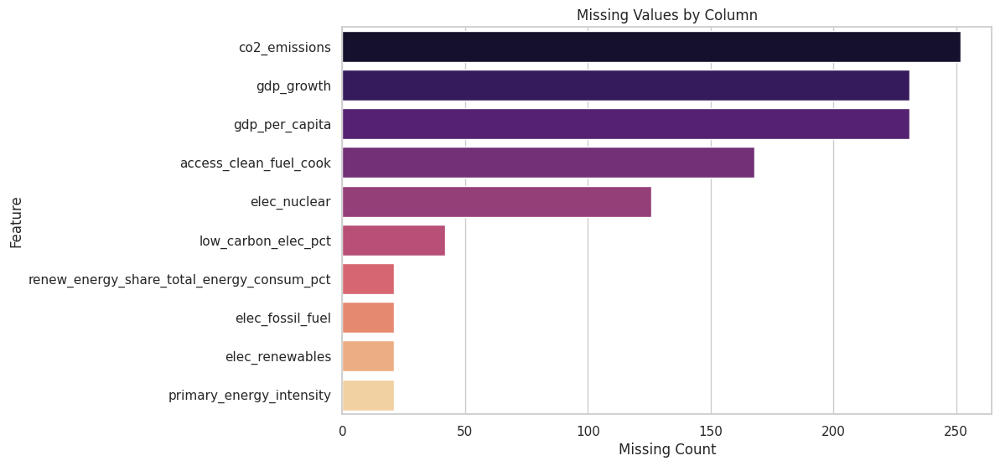

In [ ]:
sns.set(style="whitegrid")
key_vars = ['access_clean_fuel_cook', 'primary_energy_intensity']
missing_percent = eda_dataset[key_vars].isnull().mean() * 100
print("Percentage of missing values:\n", missing_percent)

missing_counts = eda_dataset.isnull().sum()
missing_counts = missing_counts[missing_counts > 0].sort_values(ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x=missing_counts.values, y=missing_counts.index, palette='magma')
plt.title("Missing Values by Column")
plt.xlabel("Missing Count")
plt.ylabel("Feature")
plt.show()

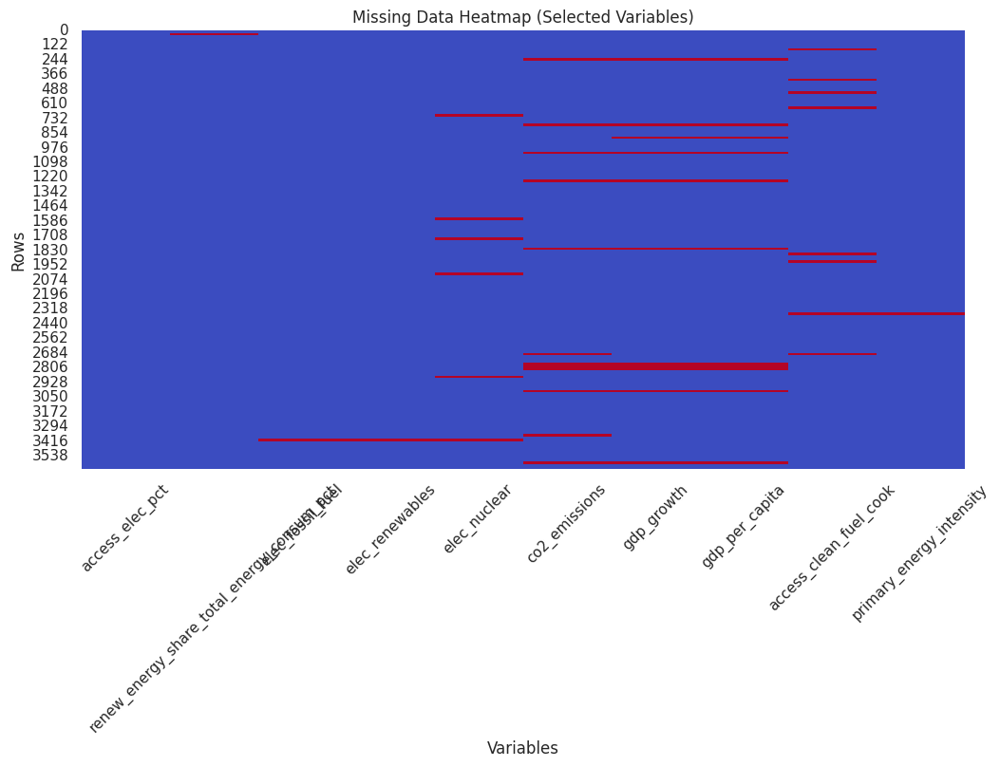

In [ ]:
cols_to_check = [
    'access_elec_pct',
    'renew_energy_share_total_energy_consum_pct',
    'elec_fossil_fuel',
    'elec_renewables',
    'elec_nuclear',
    'co2_emissions',
    'gdp_growth',
    'gdp_per_capita',
    'access_clean_fuel_cook',
    'primary_energy_intensity'
]

missing_df = eda_dataset[cols_to_check].isnull()

plt.figure(figsize=(12, 6))
sns.heatmap(missing_df, cmap='coolwarm', cbar=False)
plt.title("Missing Data Heatmap (Selected Variables)")
plt.xlabel("Variables")
plt.ylabel("Rows")
plt.xticks(rotation=45)
plt.show()

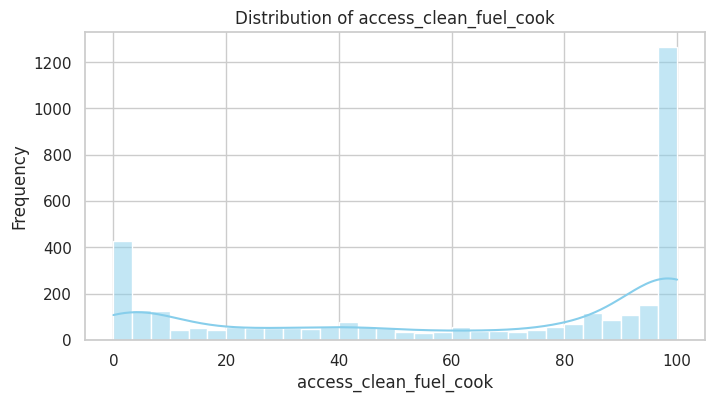

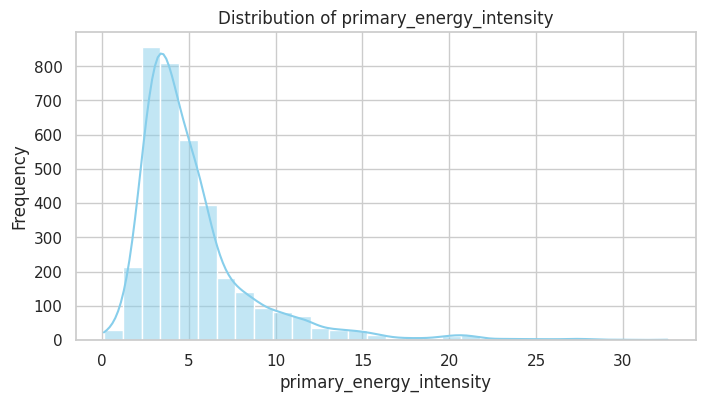

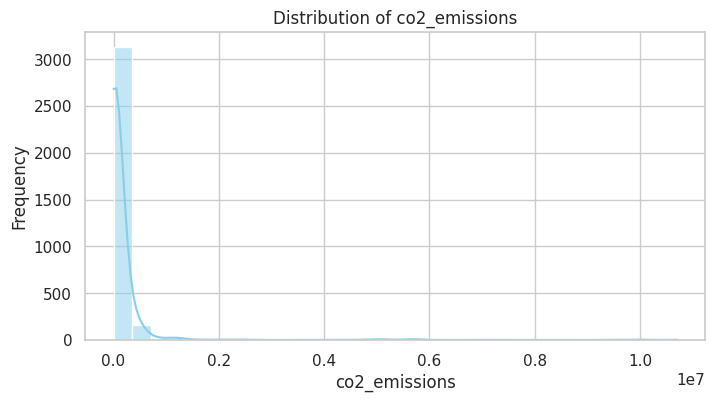

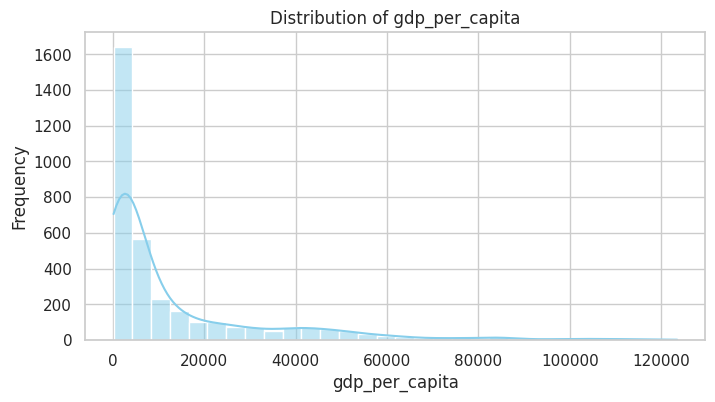

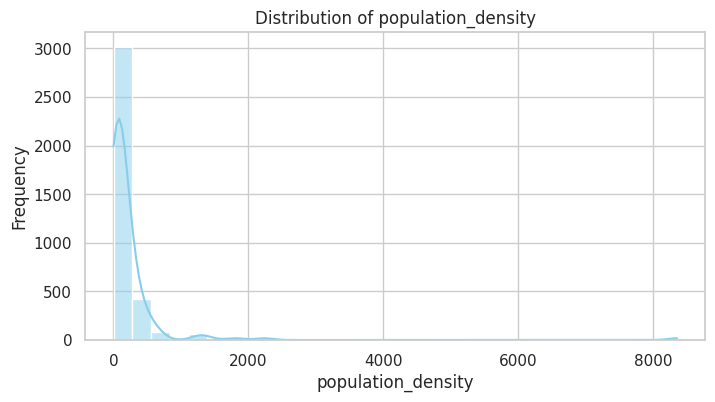

In [ ]:
dist_vars = ['access_clean_fuel_cook', 'primary_energy_intensity',
             'co2_emissions', 'gdp_per_capita', 'population_density']

for var in dist_vars:
    plt.figure(figsize=(8, 4))
    sns.histplot(eda_dataset[var].dropna(), kde=True, bins=30, color='skyblue')
    plt.title(f"Distribution of {var}")
    plt.xlabel(var)
    plt.ylabel("Frequency")
    plt.show()

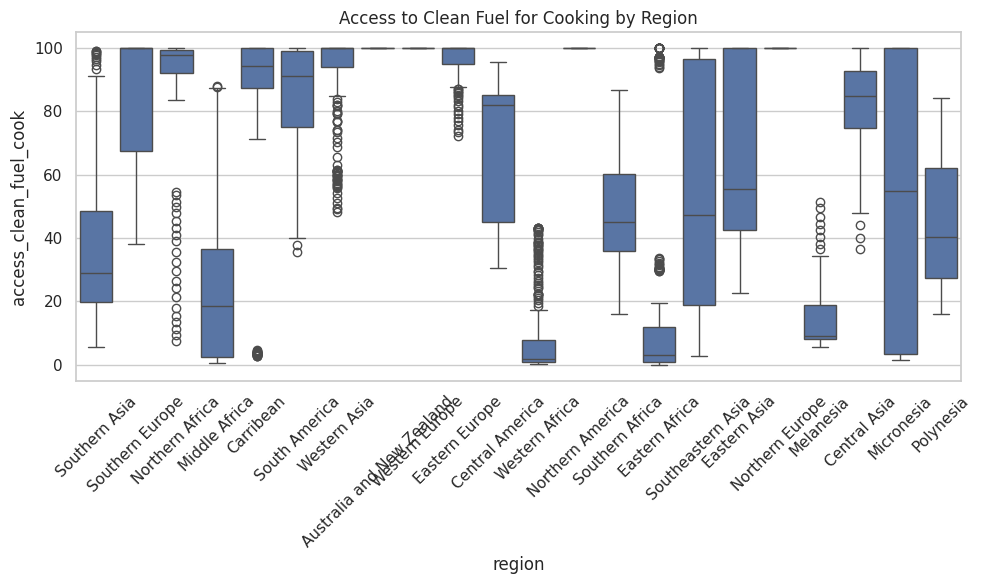

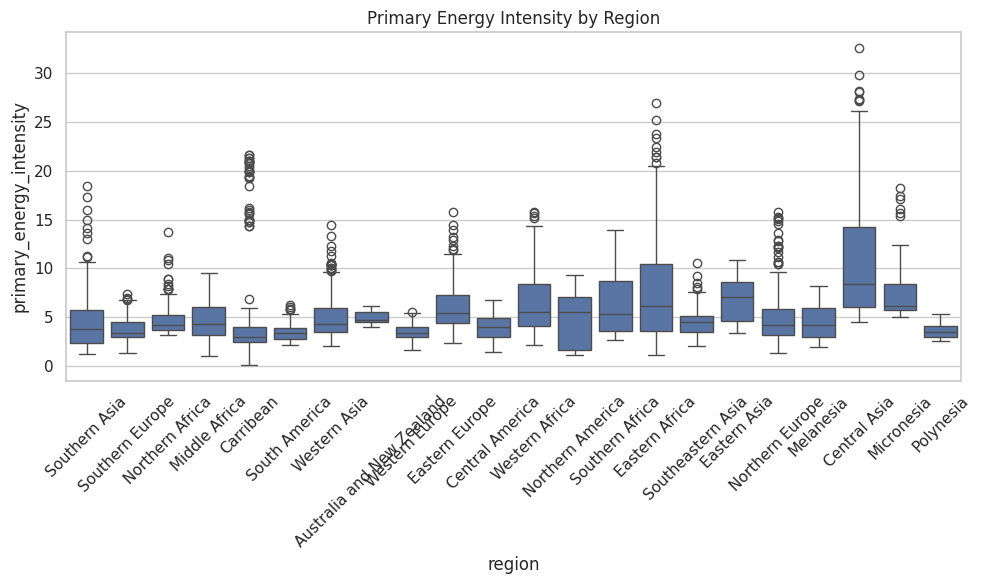

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=eda_dataset, x='region', y='access_clean_fuel_cook')
plt.title("Access to Clean Fuel for Cooking by Region")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(data=eda_dataset, x='region', y='primary_energy_intensity')
plt.title("Primary Energy Intensity by Region")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

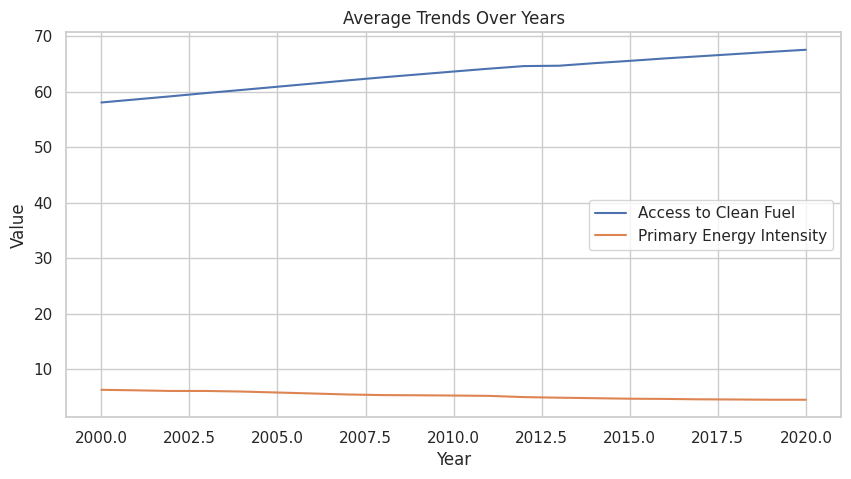

In [ ]:
time_trends = eda_dataset.groupby('year')[['access_clean_fuel_cook', 'primary_energy_intensity']].mean().reset_index()

plt.figure(figsize=(10, 5))
sns.lineplot(data=time_trends, x='year', y='access_clean_fuel_cook', label='Access to Clean Fuel')
sns.lineplot(data=time_trends, x='year', y='primary_energy_intensity', label='Primary Energy Intensity')
plt.title("Average Trends Over Years")
plt.xlabel("Year")
plt.ylabel("Value")
plt.legend()
plt.show()


## General Exploratory Data Analysis (EDA)

In [ ]:
eda_dataset[['country', 'region', 'year', 'renew_energy_share_total_energy_consum_pct']]

,country,region,year,renew_energy_share_total_energy_consum_pct
0,Afghanistan,Southern Asia,2000,44.99
1,Afghanistan,Southern Asia,2001,45.60
2,Afghanistan,Southern Asia,2002,37.83
3,Afghanistan,Southern Asia,2003,36.66
4,Afghanistan,Southern Asia,2004,44.24
...,...,...,...,...
3643,Zimbabwe,Eastern Africa,2016,81.90
3644,Zimbabwe,Eastern Africa,2017,82.46
3645,Zimbabwe,Eastern Africa,2018,80.23
3646,Zimbabwe,Eastern Africa,2019,81.50


In [ ]:
cleaned_dataset.dtypes

,0
country,object
region,object
year,int64
access_elec_pct,float64
access_clean_fuel_cook,float64
renew_energy_share_total_energy_consum_pct,float64
elec_fossil_fuel,float64
elec_nuclear,float64
elec_renewables,float64
low_carbon_elec_pct,float64


In [ ]:
# Mapping from original region to new combined region group
region_map = {
    'Eastern Africa': 'Sub-Saharan Africa',
    'Middle Africa': 'Sub-Saharan Africa',
    'Southern Africa': 'Sub-Saharan Africa',
    'Western Africa': 'Sub-Saharan Africa',
    'Northern Africa': 'North Africa & West Asia',
    'Western Asia': 'North Africa & West Asia',
    'Southern Asia': 'South & Central Asia',
    'Central Asia': 'South & Central Asia',
    'Eastern Asia': 'East & Southeast Asia',
    'Southeastern Asia': 'East & Southeast Asia',
    'Southern Europe': 'Europe',
    'Eastern Europe': 'Europe',
    'Western Europe': 'Europe',
    'Northern Europe': 'Europe',
    'Northern America': 'Americas',
    'Central America': 'Americas',
    'South America': 'Americas',
    'Carribean': 'Americas',
    'Australia and New Zealand': 'Oceania',
    'Melanesia': 'Oceania',
    'Micronesia': 'Oceania',
    'Polynesia': 'Oceania',
}

# Apply the mapping to a new column
eda_dataset['region'] = eda_dataset['region'].map(region_map)

In [ ]:
eda_dataset['region'].unique()

array(['South & Central Asia', 'Europe', 'North Africa & West Asia',
       'Sub-Saharan Africa', 'Americas', 'Oceania',
       'East & Southeast Asia'], dtype=object)

In [ ]:
# Set plot style
sns.set(style = "whitegrid")
plt.rcParams["figure.figsize"] = (10, 6)

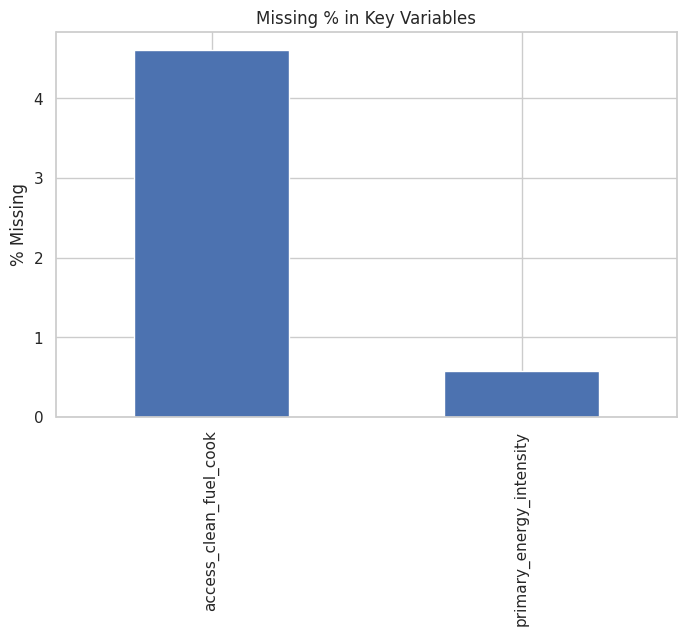

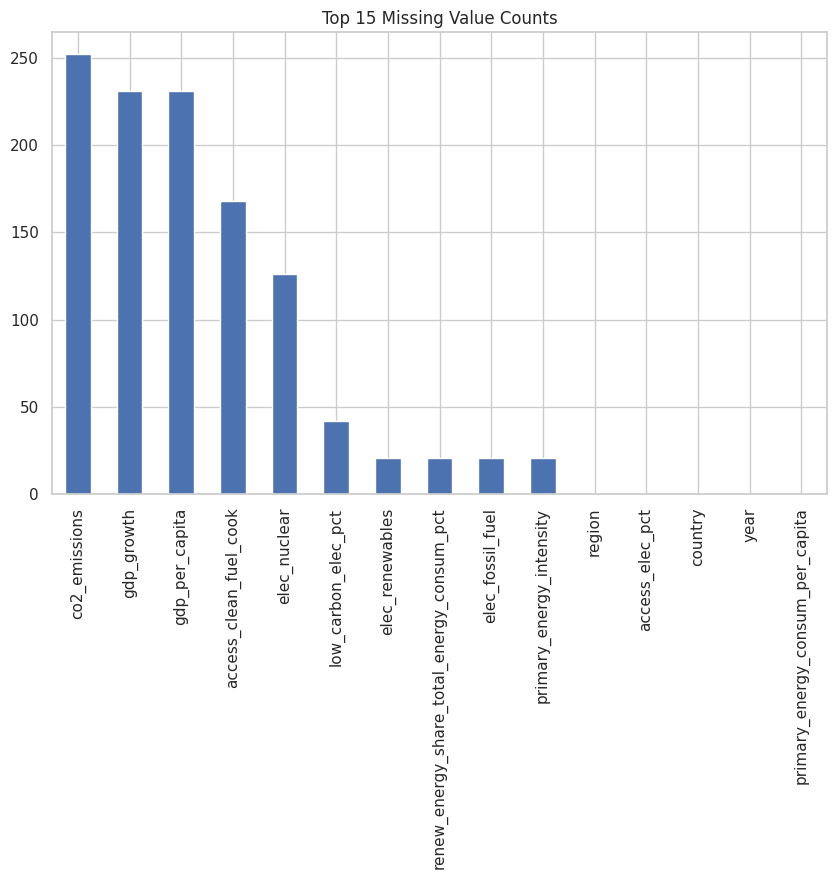

In [ ]:
# Missing percentage for key columns
key_cols = ['access_clean_fuel_cook', 'primary_energy_intensity']
missing_pct = eda_dataset[key_cols].isna().mean() * 100
missing_pct.plot(kind = 'bar', title = 'Missing % in Key Variables', ylabel='% Missing', figsize=(8,5))
plt.show()

# Missing value count by column (top 15)
eda_dataset.isna().sum().sort_values(ascending=False).head(15).plot(kind='bar', title='Top 15 Missing Value Counts')
plt.show()

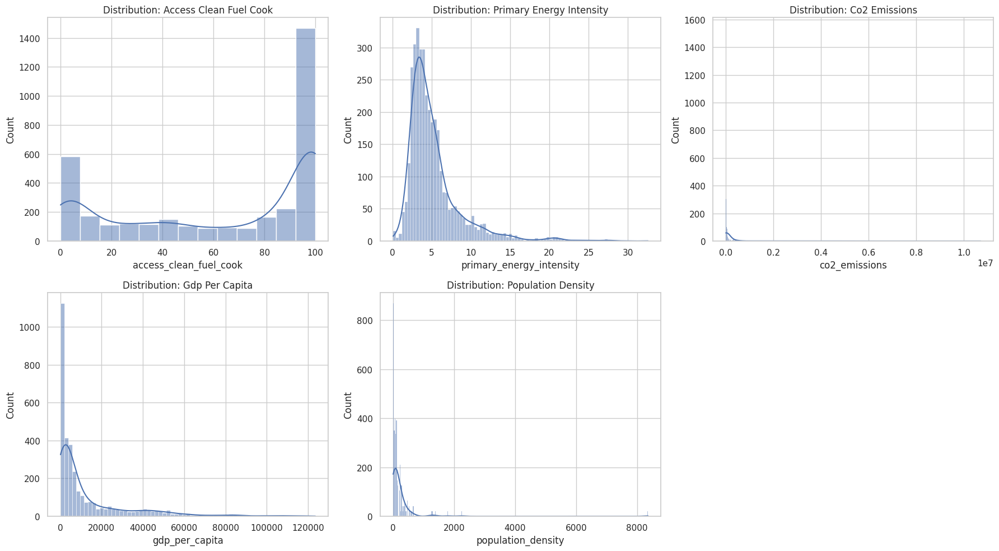

In [ ]:
dist_cols = ['access_clean_fuel_cook', 'primary_energy_intensity', 'co2_emissions', 'gdp_per_capita', 'population_density']
fig, axs = plt.subplots(2, 3, figsize=(18, 10))
axs = axs.flatten()

for i, col in enumerate(dist_cols):
    sns.histplot(eda_dataset[col].dropna(), kde=True, ax=axs[i])
    axs[i].set_title(f'Distribution: {col.replace("_", " ").title()}')

axs[-1].axis('off') # Hide last subplot if unused
plt.tight_layout()
plt.show()

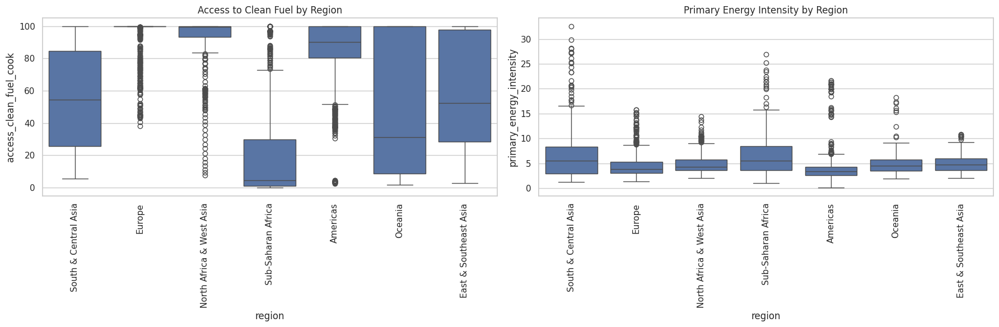

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(18, 6))

sns.boxplot(data=eda_dataset, x='region', y='access_clean_fuel_cook', ax=axs[0])
axs[0].set_title('Access to Clean Fuel by Region')
axs[0].tick_params(axis='x', rotation=90)

sns.boxplot(data=eda_dataset, x='region', y='primary_energy_intensity', ax=axs[1])
axs[1].set_title('Primary Energy Intensity by Region')
axs[1].tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()

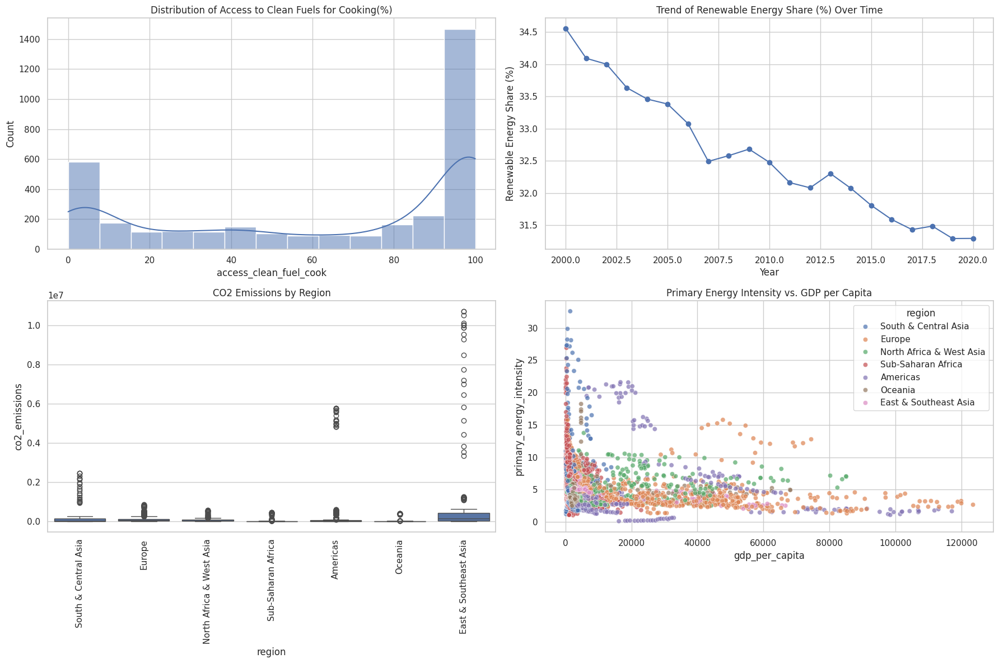

In [ ]:
sns.set(style = "whitegrid")
plt.rcParams["figure.figsize"] = (10, 6)

fig, axs = plt.subplots(2, 2, figsize = (18, 12))

# 1. Distribution of access to clean fuels
sns.histplot(eda_dataset['access_clean_fuel_cook'].dropna(), kde = True, ax = axs[0, 0])
axs[0, 0].set_title('Distribution of Access to Clean Fuels for Cooking(%)')

# 2. Trend of renewable energy share over time (average per year)
renew_trend = eda_dataset.groupby('year')['renew_energy_share_total_energy_consum_pct'].mean()
axs[0, 1].plot(renew_trend.index, renew_trend.values, marker = 'o')
axs[0, 1].set_title('Trend of Renewable Energy Share (%) Over Time')
axs[0, 1].set_xlabel('Year')
axs[0, 1].set_ylabel('Renewable Energy Share (%)')

# 3. Boxplot of CO2 emissions by region
sns.boxplot(data = eda_dataset, x = 'region', y = 'co2_emissions', ax = axs[1, 0])
axs[1, 0].set_title('CO2 Emissions by Region')
axs[1, 0].tick_params(axis = 'x', rotation = 90)

# 4. GDP per capita vs Access to Electricity
sns.scatterplot(data = eda_dataset, x = 'gdp_per_capita', y = 'primary_energy_intensity', hue = 'region', alpha = 0.7, ax = axs[1, 1])
axs[1, 1].set_title('Primary Energy Intensity vs. GDP per Capita')

plt.tight_layout()
plt.show()

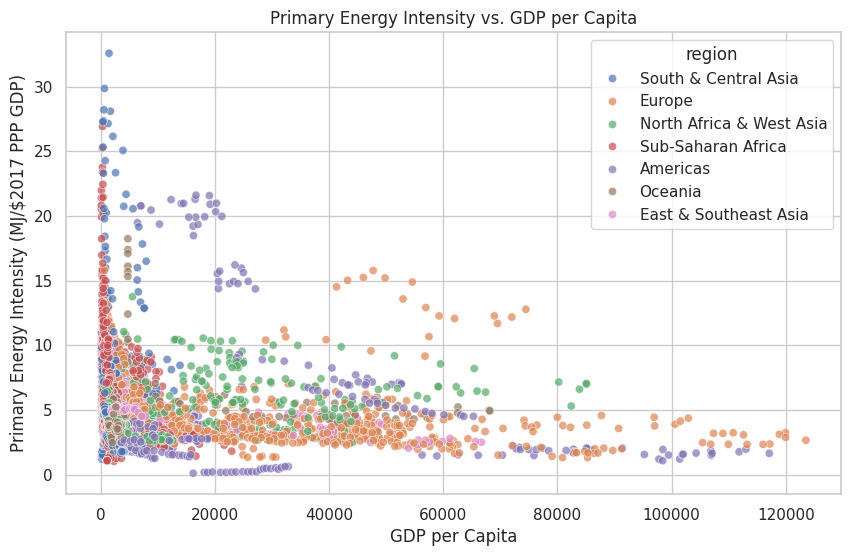

In [ ]:
sns.scatterplot(data = eda_dataset, x = 'gdp_per_capita', y = 'primary_energy_intensity', hue = 'region', alpha = 0.7)
plt.title('Primary Energy Intensity vs. GDP per Capita')
plt.xlabel('GDP per Capita')
plt.ylabel('Primary Energy Intensity (MJ/$2017 PPP GDP)')
plt.show()

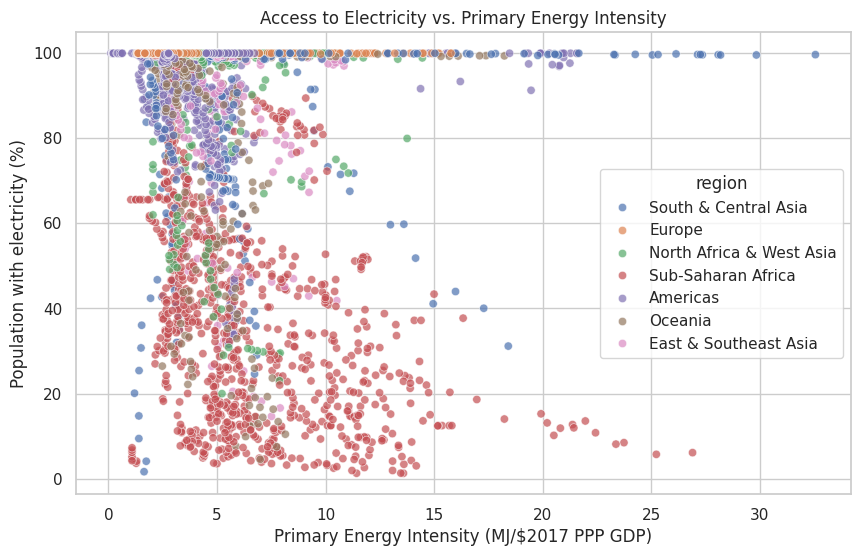

In [ ]:
sns.scatterplot(data = eda_dataset, x = 'primary_energy_intensity', y = 'access_elec_pct', hue = 'region', alpha = 0.7)
plt.title('Access to Electricity vs. Primary Energy Intensity')
plt.xlabel('Primary Energy Intensity (MJ/$2017 PPP GDP)')
plt.ylabel('Population with electricity (%)')
plt.show()

<ipython-input-237-2987482067>:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab20b', len(regions))


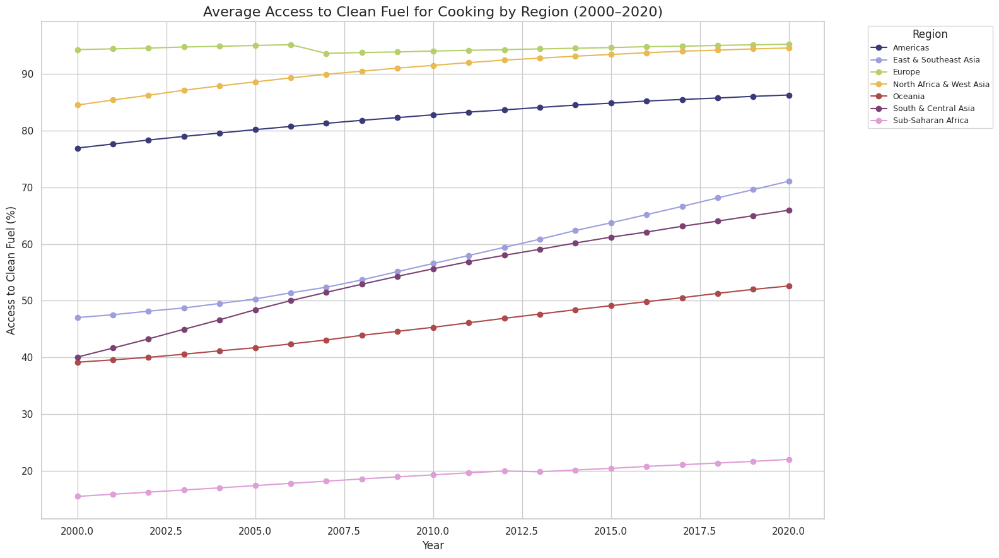

In [ ]:
# Compute average access by region over time
region_year_avg = (
    eda_dataset.groupby(['year', 'region'])['access_clean_fuel_cook']
    .mean()
    .reset_index()
)

# Get unique regions
regions = sorted(region_year_avg['region'].unique())

# Get color palette from matplotlib with enough distinct colors
colors = plt.cm.get_cmap('tab20b', len(regions))

# Create dictionary: region -> color
region_colors = {region: colors(i) for i, region in enumerate(regions)}

# Plot
plt.figure(figsize=(16, 9))

for region in regions:
    region_data = region_year_avg[region_year_avg['region'] == region]
    plt.plot(region_data['year'],
             region_data['access_clean_fuel_cook'],
             label=region,
             marker='o',
             color=region_colors[region])

plt.title('Average Access to Clean Fuel for Cooking by Region (2000–2020)', fontsize=16)
plt.xlabel('Year')
plt.ylabel('Access to Clean Fuel (%)')
plt.legend(title='Region', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)
plt.grid(True)
plt.tight_layout()
plt.show()

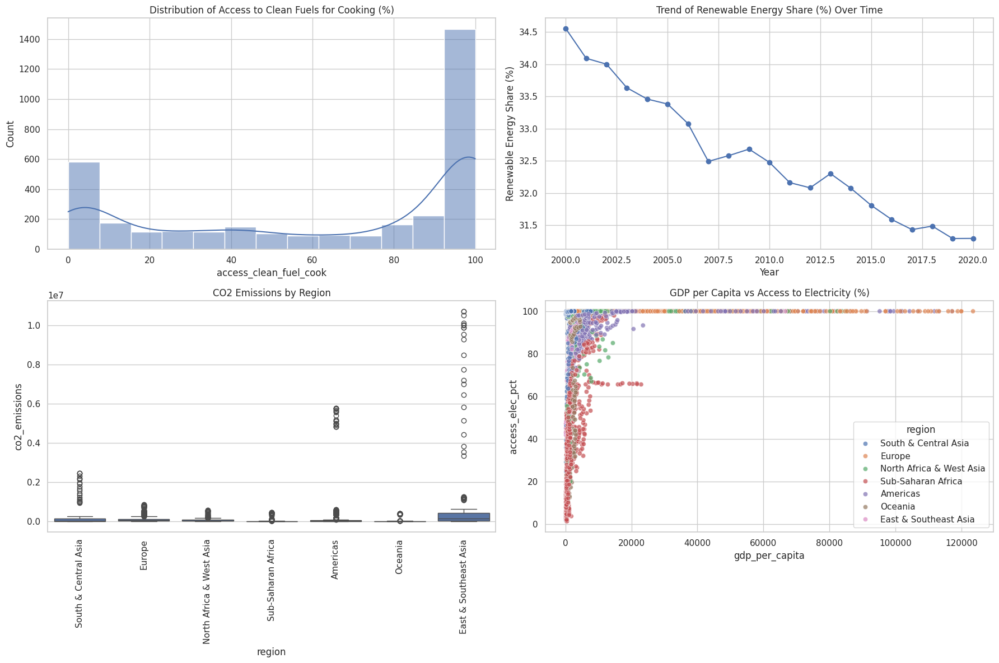

In [ ]:
sns.set(style="whitegrid")
plt.rcParams["figure.figsize"] = (10, 6)

fig, axs = plt.subplots(2, 2, figsize=(18, 12))

# 1. Distribution of access to clean fuels
fuel_data = eda_dataset[eda_dataset['access_clean_fuel_cook'] != -999]
sns.histplot(fuel_data['access_clean_fuel_cook'].dropna(), kde=True, ax=axs[0, 0])
axs[0, 0].set_title('Distribution of Access to Clean Fuels for Cooking (%)')

# 2. Trend of renewable energy share over time (average per year)
renew_data = eda_dataset[eda_dataset['renew_energy_share_total_energy_consum_pct'] != -999]
renew_trend = renew_data.groupby('year')['renew_energy_share_total_energy_consum_pct'].mean()
axs[0, 1].plot(renew_trend.index, renew_trend.values, marker='o')
axs[0, 1].set_title('Trend of Renewable Energy Share (%) Over Time')
axs[0, 1].set_xlabel('Year')
axs[0, 1].set_ylabel('Renewable Energy Share (%)')

# 3. Boxplot of CO2 emissions by region
co2_data = eda_dataset[cleaned_dataset['co2_emissions'] != -999]
sns.boxplot(data=co2_data, x='region', y='co2_emissions', ax=axs[1, 0])
axs[1, 0].set_title('CO2 Emissions by Region')
axs[1, 0].tick_params(axis='x', rotation=90)

# 4. GDP per capita vs Access to Electricity
elec_data = eda_dataset[
    (eda_dataset['gdp_per_capita'] != -999) &
    (eda_dataset['access_elec_pct'] != -999)
]
sns.scatterplot(data=elec_data, x='gdp_per_capita', y='access_elec_pct', hue='region', alpha=0.7, ax=axs[1, 1])
axs[1, 1].set_title('GDP per Capita vs Access to Electricity (%)')

plt.tight_layout()
plt.show()

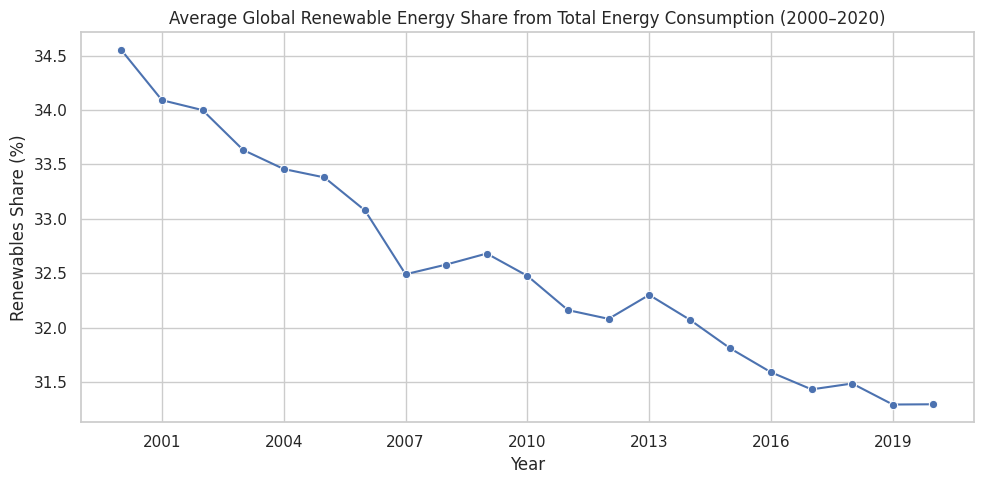

In [ ]:
import matplotlib.ticker as ticker

# Group by year and take mean
yearly_avg = eda_dataset.groupby('year')['renew_energy_share_total_energy_consum_pct'].mean().reset_index()

# Plot
plt.figure(figsize=(10, 5))
sns.lineplot(data=yearly_avg, x='year', y='renew_energy_share_total_energy_consum_pct', marker='o')
plt.title('Average Global Renewable Energy Share from Total Energy Consumption (2000–2020)')
plt.ylabel('Renewables Share (%)')
plt.xlabel('Year')
plt.gca().xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
plt.tight_layout()
plt.show()

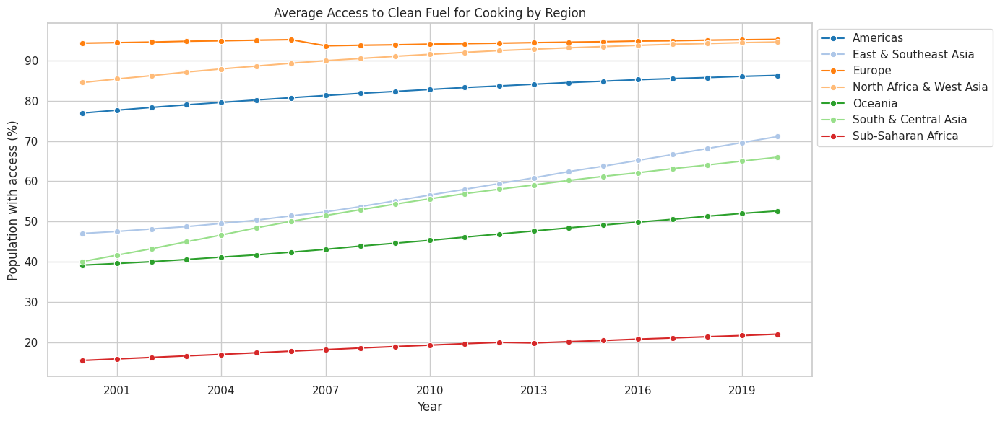

In [ ]:
import matplotlib.ticker as ticker

def plot_regional_year_avg(dataset, col_name, ylabel, title = 'Average (2000-2020) by Region'):
  region_yearly_avg = eda_dataset.groupby(['region', 'year'])[
    [col_name]
  ].mean().reset_index()

  plt.figure(figsize=(14, 6))
  sns.lineplot(data=region_yearly_avg, x='year', y=col_name,
              hue='region', palette='tab20', marker='o')
  plt.title(title)
  plt.ylabel(ylabel)
  plt.xlabel('Year')
  plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
  plt.gca().xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
  plt.tight_layout()
  plt.show()

# Group by region and year
plot_regional_year_avg(eda_dataset, 'access_clean_fuel_cook', 'Population with access (%)', 'Average Access to Clean Fuel for Cooking by Region')

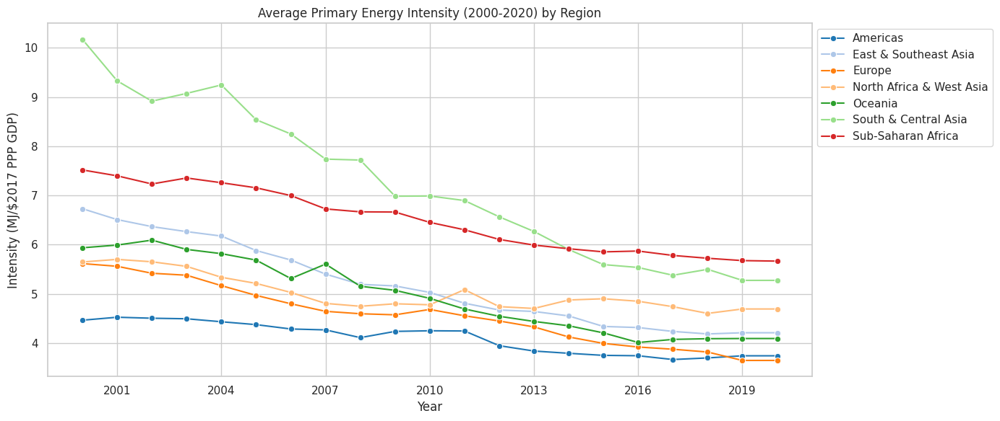

In [ ]:
plot_regional_year_avg(eda_dataset, 'primary_energy_intensity', 'Intensity (MJ/$2017 PPP GDP)', 'Average Primary Energy Intensity (2000-2020) by Region')

access_elec_pct

access_clean_fuel_cook

renew_energy_share_total_energy_consum_pct

elec_fossil_fuel

elec_nuclear

elec_renewables

low_carbon_elec_pct

primary_energy_consum_per_capita

primary_energy_intensity

co2_emissions

gdp_growth

gdp_per_capita

population_density

land_area

latitude

longitude

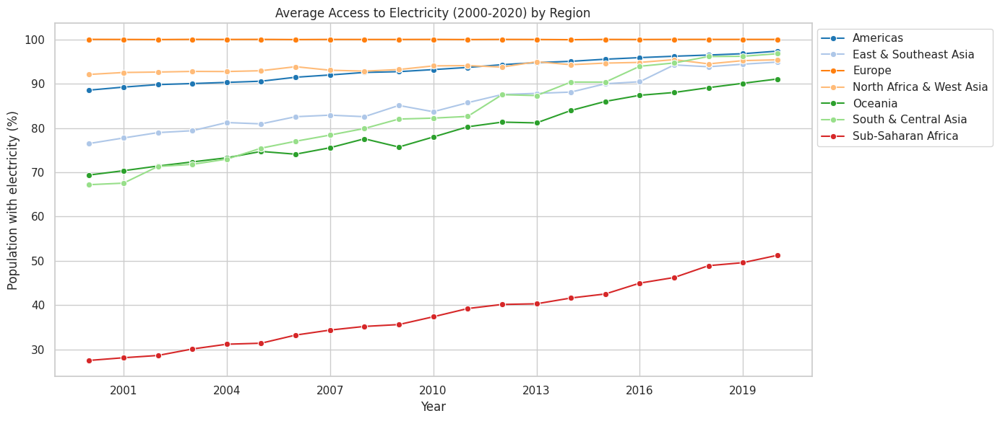

In [ ]:
plot_regional_year_avg(eda_dataset, 'access_elec_pct', 'Population with electricity (%)', 'Average Access to Electricity (2000-2020) by Region')

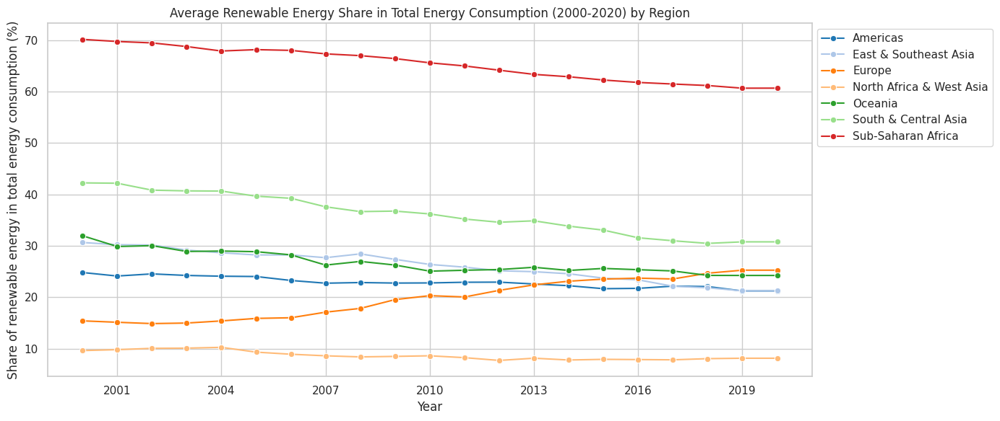

In [ ]:
plot_regional_year_avg(eda_dataset, 'renew_energy_share_total_energy_consum_pct', 'Share of renewable energy in total energy consumption (%)', 'Average Renewable Energy Share in Total Energy Consumption (2000-2020) by Region')

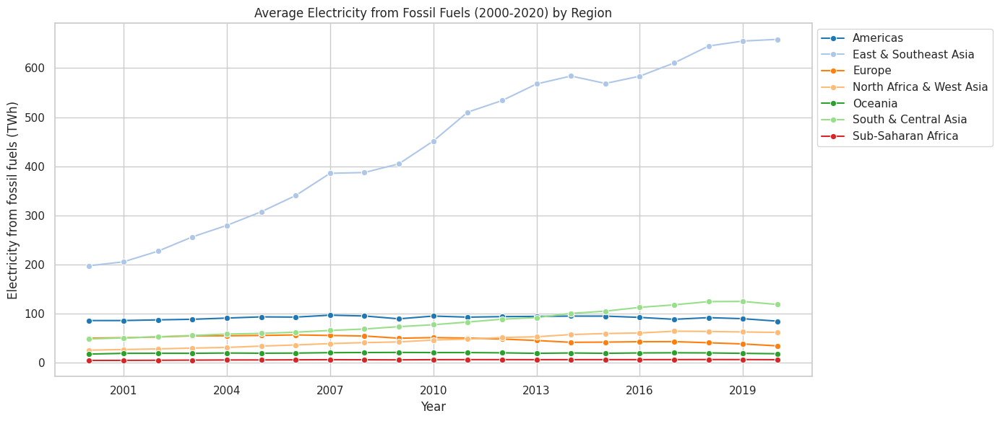

In [ ]:
plot_regional_year_avg(eda_dataset, 'elec_fossil_fuel', 'Electricity from fossil fuels (TWh)', 'Average Electricity from Fossil Fuels (2000-2020) by Region')

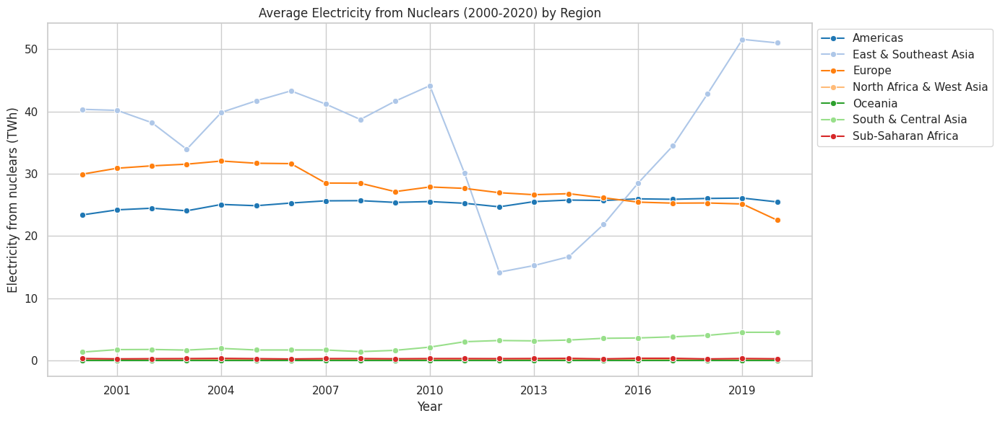

In [ ]:
plot_regional_year_avg(eda_dataset, 'elec_nuclear', 'Electricity from nuclears (TWh)', 'Average Electricity from Nuclears (2000-2020) by Region')

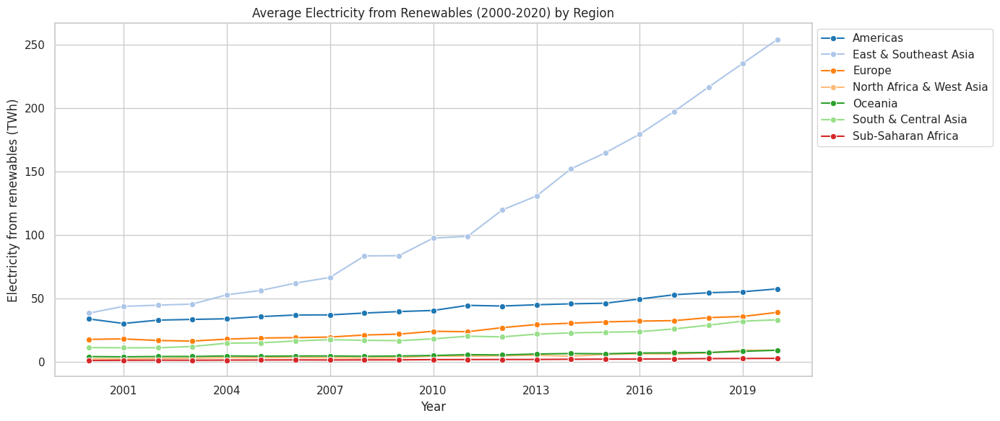

In [ ]:
plot_regional_year_avg(eda_dataset, 'elec_renewables', 'Electricity from renewables (TWh)', 'Average Electricity from Renewables (2000-2020) by Region')

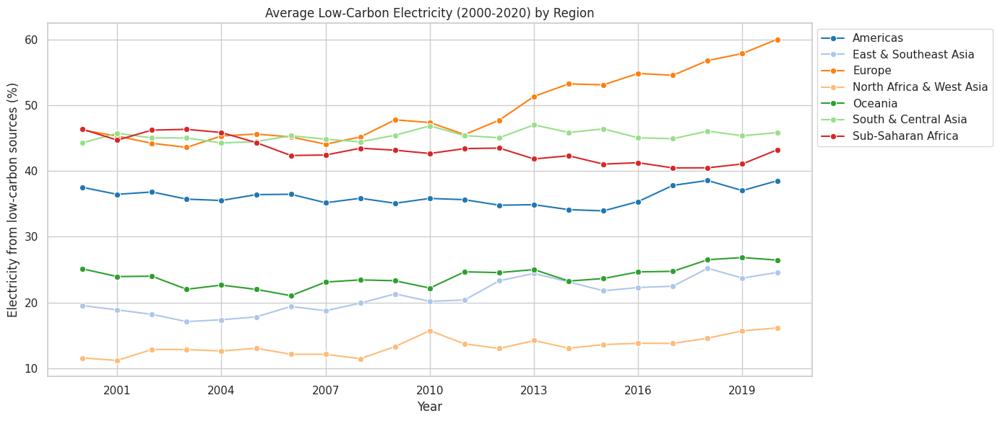

In [ ]:
plot_regional_year_avg(eda_dataset, 'low_carbon_elec_pct', 'Electricity from low-carbon sources (%)', 'Average Low-Carbon Electricity (2000-2020) by Region')

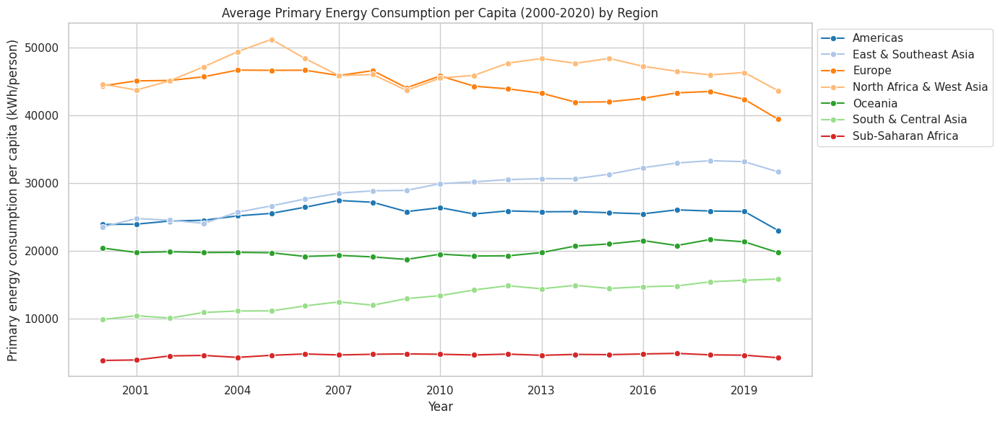

In [ ]:
plot_regional_year_avg(eda_dataset, 'primary_energy_consum_per_capita', 'Primary energy consumption per capita (kWh/person)', 'Average Primary Energy Consumption per Capita (2000-2020) by Region')

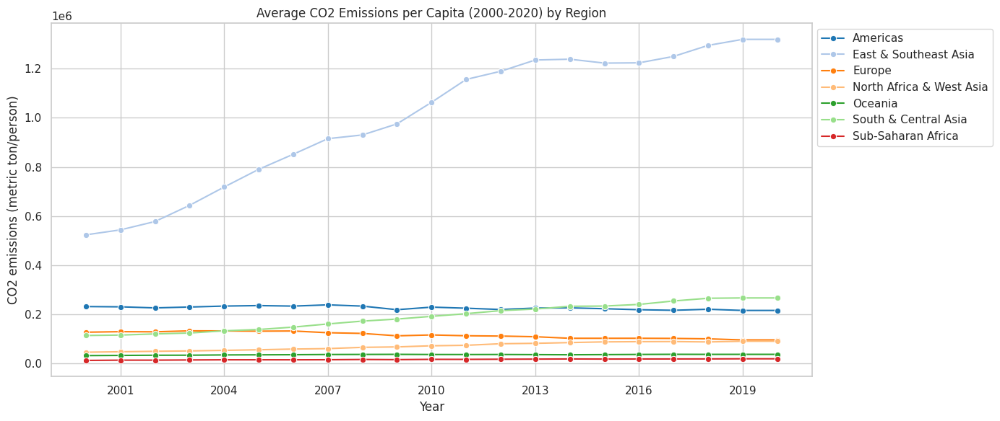

In [ ]:
plot_regional_year_avg(eda_dataset, 'co2_emissions', 'CO2 emissions (metric ton/person)', 'Average CO2 Emissions per Capita (2000-2020) by Region')

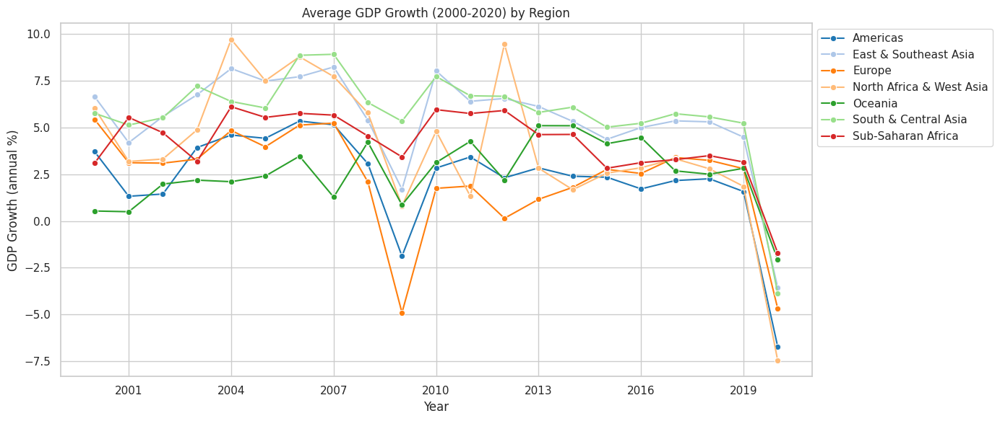

In [ ]:
plot_regional_year_avg(eda_dataset, 'gdp_growth', 'GDP Growth (annual %)', 'Average GDP Growth (2000-2020) by Region')

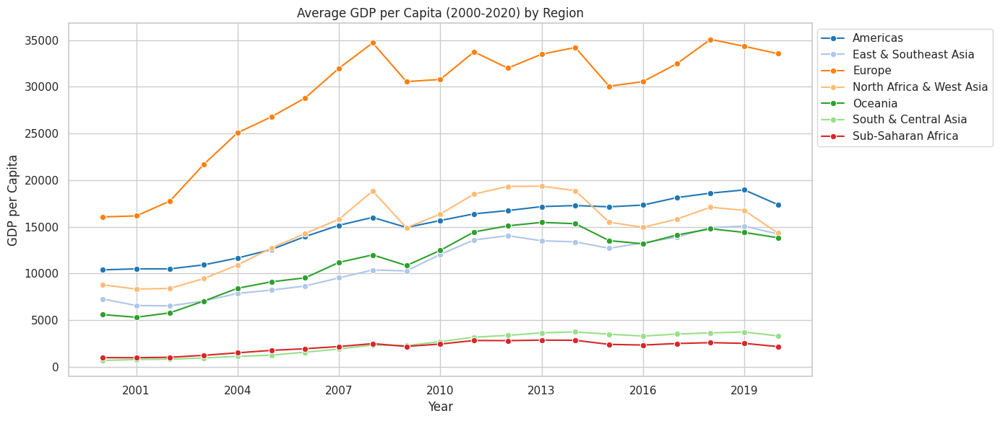

In [ ]:
plot_regional_year_avg(eda_dataset, 'gdp_per_capita', 'GDP per Capita', 'Average GDP per Capita (2000-2020) by Region')

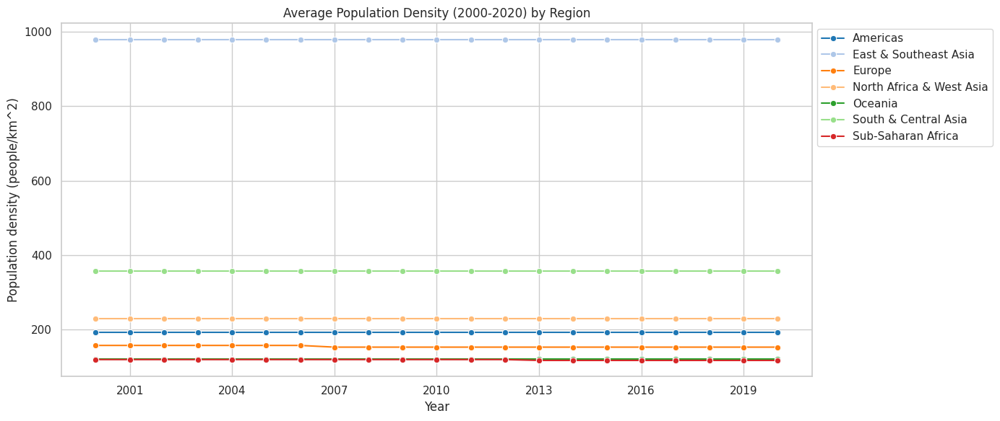

In [ ]:
plot_regional_year_avg(eda_dataset, 'population_density', 'Population density (people/km^2)', 'Average Population Density (2000-2020) by Region')

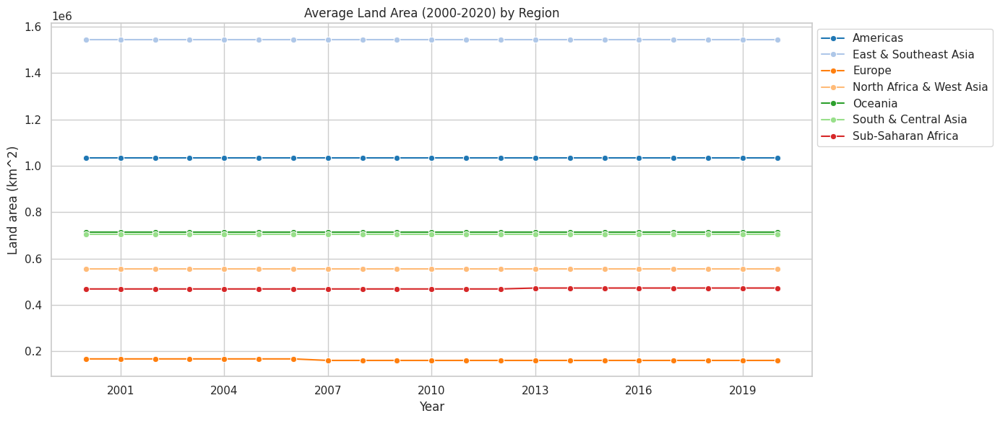

In [ ]:
plot_regional_year_avg(eda_dataset, 'land_area', 'Land area (km^2)', 'Average Land Area (2000-2020) by Region')

<ipython-input-254-3604399515>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=eda_dataset, x='region', y='access_clean_fuel_cook', palette='tab20')
<ipython-input-254-3604399515>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=eda_dataset, x='region', y='primary_energy_intensity', palette='tab20')


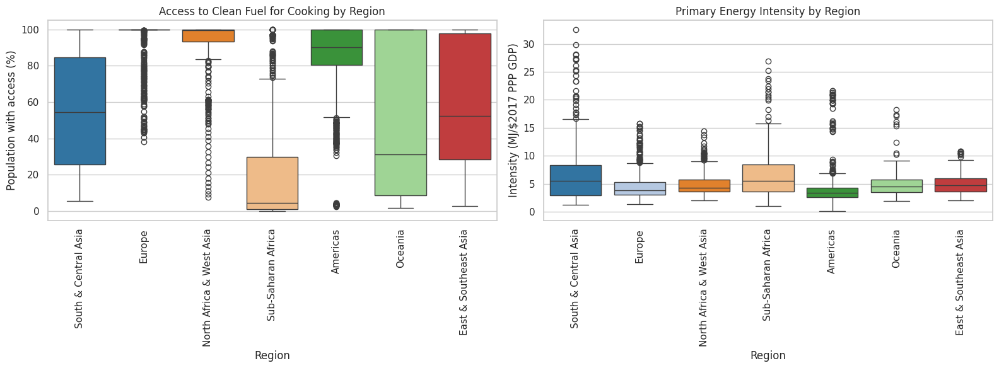

In [ ]:
plt.figure(figsize=(16, 6))

# Access to clean fuel
plt.subplot(1, 2, 1)
sns.boxplot(data=eda_dataset, x='region', y='access_clean_fuel_cook', palette='tab20')
plt.xticks(rotation=90)
plt.title('Access to Clean Fuel for Cooking by Region')
plt.ylabel('Population with access (%)')
plt.xlabel('Region')

# Primary energy intensity
plt.subplot(1, 2, 2)
sns.boxplot(data=eda_dataset, x='region', y='primary_energy_intensity', palette='tab20')
plt.xticks(rotation=90)
plt.title('Primary Energy Intensity by Region')
plt.ylabel('Intensity (MJ/$2017 PPP GDP)')
plt.xlabel('Region')

plt.tight_layout()
plt.show()

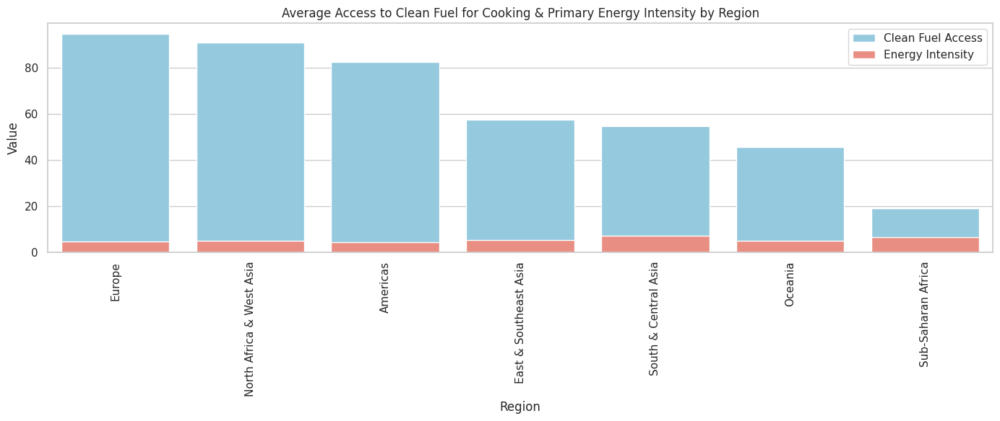

In [ ]:
# Compute regional means
regional_avg = eda_dataset.groupby('region')[
    ['access_clean_fuel_cook', 'primary_energy_intensity']
].mean().reset_index().sort_values('access_clean_fuel_cook', ascending=False)

# Plot
plt.figure(figsize=(14, 6))

sns.barplot(data=regional_avg, x='region', y='access_clean_fuel_cook', color='skyblue', label='Clean Fuel Access')
sns.barplot(data=regional_avg, x='region', y='primary_energy_intensity', color='salmon', label='Energy Intensity')

plt.xticks(rotation=90)
plt.title('Average Access to Clean Fuel for Cooking & Primary Energy Intensity by Region')
plt.ylabel('Value')
plt.xlabel('Region')
plt.legend()
plt.tight_layout()
plt.show()


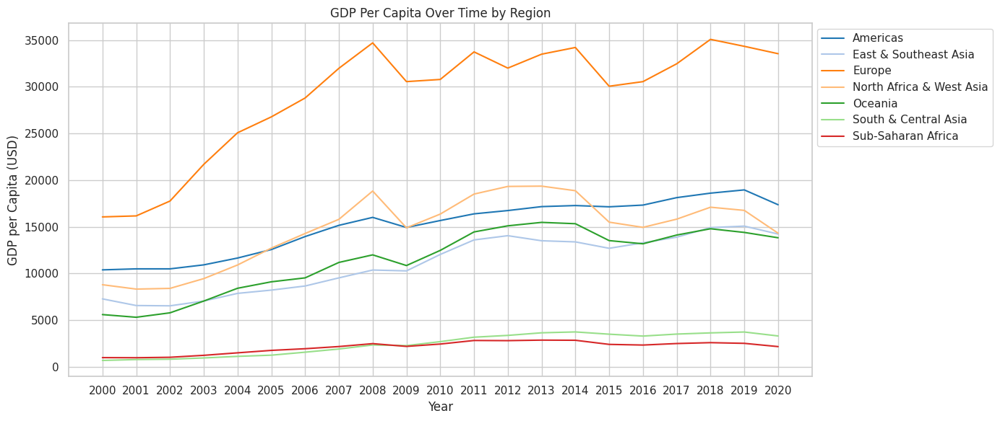

In [ ]:
# Group by region and year
gdp_region_year = eda_dataset.groupby(['region', 'year'])['gdp_per_capita'].mean().reset_index()

# Plot
plt.figure(figsize=(14, 6))
sns.lineplot(data=gdp_region_year, x='year', y='gdp_per_capita', hue='region', palette='tab20')
plt.title('GDP Per Capita Over Time by Region')
plt.ylabel('GDP per Capita (USD)')
plt.xlabel('Year')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.xticks(gdp_region_year['year'].unique())
plt.tight_layout()
plt.show()

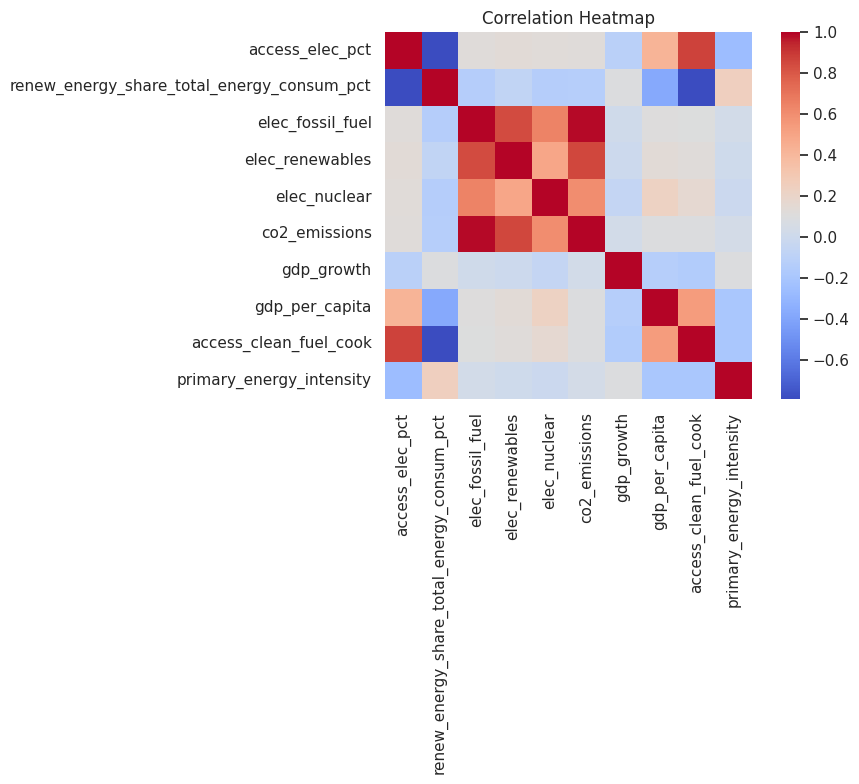

In [ ]:
cols = [
    'access_elec_pct',
    'renew_energy_share_total_energy_consum_pct',
    'elec_fossil_fuel',
    'elec_renewables',
    'elec_nuclear',
    'co2_emissions',
    'gdp_growth',
    'gdp_per_capita',
    'access_clean_fuel_cook',
    'primary_energy_intensity'
]

# Compute correlation matrix
corr = eda_dataset[cols].corr()

# Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr, cmap='coolwarm', annot=False, square=True, cbar=True)
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()

## Preparing Target Variables

Regression target: access_clean_fuel_cook
Classification target: primary_energy_intensity

We exclude rows with sentinel values (-999) in target variables.

We create a column that classifies the energy intensity of a country in a certain year.

In [ ]:
sentinel_value = -999
targets = ['access_clean_fuel_cook', 'primary_energy_intensity']

# Filter out rows where either target variable has the sentinel value
prepared_dataset = dataset[~dataset[targets].isin([sentinel_value]).any(axis = 1)].copy()



print(f"Rows before filtering: {len(dataset)}")
print(f"Rows after filtering: {len(prepared_dataset)}")

Rows before filtering: 3648
Rows after filtering: 3480


In [ ]:
reg_df = prepared_dataset.copy()
reg_region_df = reg_df.copy()
reg_df = reg_df.drop(columns = ['region', 'access_clean_fuel_cook_missing', 'access_clean_fuel_cook_missing_all'])

In [ ]:
prepared_dataset['access_clean_fuel_cook'].describe()

,access_clean_fuel_cook
count,3480.000000
mean,63.255287
std,39.043658
min,0.000000
25%,23.175000
50%,83.150000
75%,100.000000
max,100.000000


In [ ]:
prepared_dataset['primary_energy_intensity'].describe()

,primary_energy_intensity
count,3480.000000
mean,5.290413
std,3.460473
min,1.030000
25%,3.180000
50%,4.300000
75%,5.980000
max,32.570000


In [ ]:
# Equal-frequency binning primary energy intensity (PEI)
prepared_dataset['pei_class'] = pd.qcut(
    prepared_dataset['primary_energy_intensity'],
    q = 3,
    labels = [0, 1, 2]
)

print(prepared_dataset['pei_class'].value_counts())

pei_class
0    1168
2    1159
1    1153
Name: count, dtype: int64


In [ ]:
classification_region_df = prepared_dataset.copy()
classification_df = prepared_dataset.drop(columns = ['region', 'primary_energy_intensity', 'primary_energy_intensity_missing', 'primary_energy_intensity_missing_all'])

## Encoding using Smoothed Target Encoding

Note that the dataset has been split into two, one for the regression task and one for the classification task.

Let's define the smooth target encoding helper function:

In [ ]:
def smooth_target_encoding(df, categorical_col, target_col, smoothing = 10):
    """
    Smooth target encoding for categorical variable.

    Parameters:
    - df: pandas DataFrame
    - categorical_col: column to encode (string)
    - target_col: target column for encoding (string)
    - smoothing: smoothing factor, higher means stronger regularization (int)

    Returns:
    - encoding_map: dict with category as key and smoothed mean as value
    - encoded_series: pandas Series with encoded values for the categorical_col
    """

    # Compute global mean of target
    global_mean = df[target_col].mean()

    # Compute count and mean per category
    stats = df.groupby(categorical_col)[target_col].agg(['count', 'mean'])

    # Compute smoothing
    counts = stats['count']
    means = stats['mean']

    smoothing_factor = 1 / (1 + np.exp(-(counts - smoothing)))

    # Smoothed means
    smooth_means = global_mean * (1 - smoothing_factor) + means * smoothing_factor

    # Map categories to smoothed means
    encoding_map = smooth_means.to_dict()

    # Apply encoding
    encoded_series = df[categorical_col].map(encoding_map)

    return encoding_map, encoded_series

In [ ]:
# Encoding reg_df, that has categorical variable 'country' and target 'primary_energy_intensity'
reg_encoding_map, reg_df['country_encoded'] = smooth_target_encoding(
    reg_df,
    categorical_col = 'country',
    target_col = 'primary_energy_intensity',
    smoothing = 10
)

In [ ]:
# Encoding classification_df, that has categorical variable 'country' and target 'pei_class'(values of 0, 1, 2)
# Convert pei_class to integer because it is currently categorical
classification_df['pei_class'] = classification_df['pei_class'].astype(int)

class_encoding_map, classification_df['country_encoded'] = smooth_target_encoding(
    classification_df,
    categorical_col = 'country',
    target_col = 'pei_class',
    smoothing = 10
)

In [ ]:
# Drop country column from both datasets
reg_df = reg_df.drop(columns = ['country', 'country_encoded'])
classification_df = classification_df.drop(columns = ['country', 'country_encoded'])

## Splitting Regression and Classification Datasets Each into Training and Testing Sets

In [ ]:
from sklearn.model_selection import train_test_split

# For reg_df
# y: access_clean_fuel_cook
# Prepare the independent features (x) and target variable (y)
x_reg = reg_df.drop(columns = ['access_clean_fuel_cook'])
y_reg = reg_df['access_clean_fuel_cook']

# Split the data into training and testing sets
x_reg_train, x_reg_test, y_reg_train, y_reg_test = train_test_split(x_reg, y_reg, test_size = 0.2, random_state = 22002548)

# For classification_df
# y: pei_class
# Prepare the independent features (x) and target variable (y)
x_class = classification_df.drop(columns = ['pei_class'])
y_class = classification_df['pei_class']

# Split the data into training and testing sets
x_class_train, x_class_test, y_class_train, y_class_test = train_test_split(x_class, y_class, test_size = 0.2, random_state = 22002548)

# Analyse the shapes of the training and testing sets
# reg_df
print("Regression Dataset")
print("Training set's shape - x: ", x_reg_train.shape, ", y: ", y_reg_train.shape)
print("Testing set's shape - x: ", x_reg_test.shape, ", y: ", y_reg_test.shape)

# class_df
print("\nClassification Dataset")
print("Training set's shape - x: ", x_class_train.shape, ", y: ", y_class_train.shape)
print("Testing set's shape - x: ", x_class_test.shape, ", y: ", y_class_test.shape)

Regression Dataset
Training set's shape - x:  (2784, 36) , y:  (2784,)
Testing set's shape - x:  (696, 36) , y:  (696,)

Classification Dataset
Training set's shape - x:  (2784, 36) , y:  (2784,)
Testing set's shape - x:  (696, 36) , y:  (696,)


## Feature Scaling the Regression and Classification Datasets using StandardScaler

In [ ]:
from sklearn.preprocessing import StandardScaler

# Scaling regression dataset
reg_scaler = StandardScaler()
x_reg_train_scaled = reg_scaler.fit_transform(x_reg_train)
x_reg_test_scaled = reg_scaler.transform(x_reg_test)

# Scaling classification dataset
class_scaler = StandardScaler()
x_class_train_scaled = class_scaler.fit_transform(x_class_train)
x_class_test_scaled = class_scaler.transform(x_class_test)

In [ ]:
# Check scaled datasets' shapes
print("x_reg_train_scaled shape:", x_reg_train_scaled.shape)
print("x_reg_test_scaled shape:", x_reg_test_scaled.shape)

print("x_class_train_scaled shape:", x_class_train_scaled.shape)
print("x_class_test_scaled shape:", x_class_test_scaled.shape)

x_reg_train_scaled shape: (2784, 36)
x_reg_test_scaled shape: (696, 36)
x_class_train_scaled shape: (2784, 36)
x_class_test_scaled shape: (696, 36)


# Access to Clean Fuel for Cooking Prediction (Regression) Model-Building

Dataset: reg_df

For model training use:
x_reg_train_scaled,
x_reg_test_scaled,
y_reg_train,
y_reg_test

### Regression Exploratory Data Analysis (EDA)

In [ ]:
reg_region_df

,country,region,year,access_elec_pct,access_clean_fuel_cook,...,elec_renewables_missing_all,elec_fossil_fuel_missing,elec_fossil_fuel_missing_all,access_elec_pct_missing,access_elec_pct_missing_all
0,Afghanistan,Southern Asia,2000,1.613591,6.2,...,0,0,0,0,0
1,Afghanistan,Southern Asia,2001,4.074574,7.2,...,0,0,0,0,0
2,Afghanistan,Southern Asia,2002,9.409158,8.2,...,0,0,0,0,0
3,Afghanistan,Southern Asia,2003,14.738506,9.5,...,0,0,0,0,0
4,Afghanistan,Southern Asia,2004,20.064968,10.9,...,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
3643,Zimbabwe,Eastern Africa,2016,42.561730,29.8,...,0,0,0,0,0
3644,Zimbabwe,Eastern Africa,2017,44.178635,29.8,...,0,0,0,0,0
3645,Zimbabwe,Eastern Africa,2018,45.572647,29.9,...,0,0,0,0,0
3646,Zimbabwe,Eastern Africa,2019,46.781475,30.1,...,0,0,0,0,0


In [ ]:
reg_region_df.dtypes

,0
country,object
region,object
year,int64
access_elec_pct,float64
access_clean_fuel_cook,float64
renew_energy_share_total_energy_consum_pct,float64
elec_fossil_fuel,float64
elec_nuclear,float64
elec_renewables,float64
low_carbon_elec_pct,float64


In [ ]:
reg_df.dtypes

,0
year,int64
access_elec_pct,float64
access_clean_fuel_cook,float64
renew_energy_share_total_energy_consum_pct,float64
elec_fossil_fuel,float64
elec_nuclear,float64
elec_renewables,float64
low_carbon_elec_pct,float64
primary_energy_consum_per_capita,float64
primary_energy_intensity,float64


In [ ]:
# Drop the target variable
features_only = reg_df.drop(columns = ['access_clean_fuel_cook'])

In [ ]:
# Compute correlation matrix
correlation_matrix = features_only.corr()

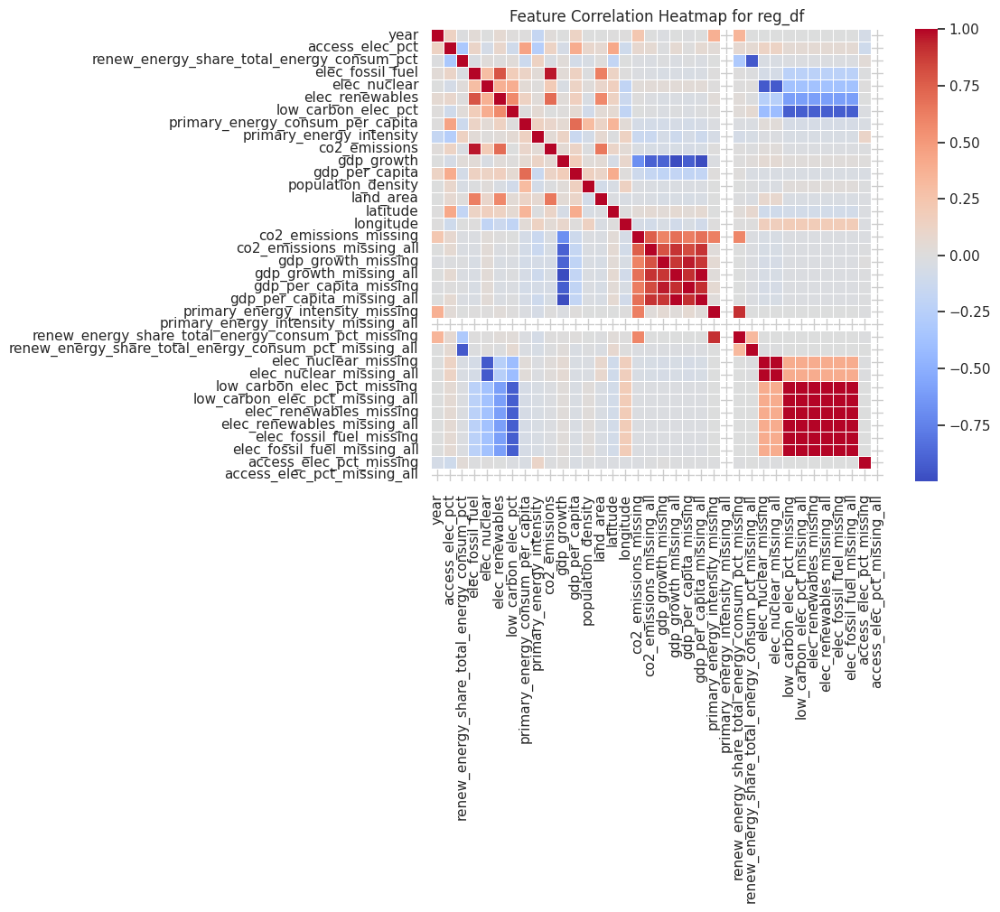

In [ ]:
# Create the heatmap
plt.figure(figsize = (12, 10))
sns.heatmap(correlation_matrix, annot = False, fmt = ".2f", cmap = "coolwarm", square = True, linewidths = 0.5)
plt.title("Feature Correlation Heatmap for reg_df")
plt.tight_layout()
plt.show()

## Linear Regression

In [ ]:
from sklearn.model_selection import GridSearchCV

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import KFold, cross_val_score

def reg_cv_scores(model, X, y, k = 20):
    kf = KFold(n_splits = k)
    mse_scores = -cross_val_score(model, X, y, cv = kf, scoring = 'neg_mean_squared_error')
    r2_scores = cross_val_score(model, X, y, cv = kf, scoring = 'r2')
    print(f"{model.__class__.__name__} CV Mean MSE: {mse_scores.mean():.4f} ± {mse_scores.std():.4f}")
    print(f"{model.__class__.__name__} CV Mean RMSE: {np.sqrt(mse_scores.mean()):.4f} ± {np.sqrt(mse_scores.std()):.4f}")
    print(f"{model.__class__.__name__} CV Mean R^2 Score: {r2_scores.mean():.4f} ± {r2_scores.std():.4f}\n")

def evaluate_reg_output(y_pred, model_name = "Model"):

  mse = mean_squared_error(y_reg_test, y_pred)
  rmse = np.sqrt(mse)
  r2 = r2_score(y_reg_test, y_pred)

  print(f"{model_name} Evaluation Metrics:\n")
  print(f"Mean Squared Error (MSE): {mse}")
  print(f"Root Mean Squared Error (RMSE): {rmse}")
  print(f"R^2 Score (R^2): {r2}\n")

In [ ]:
from sklearn.linear_model import LinearRegression

lr = LinearRegression()
lr.fit(x_reg_train_scaled, y_reg_train)

y_pred_lr = lr.predict(x_reg_test_scaled)

evaluate_reg_output(y_pred_lr, model_name = "Linear Regression")

reg_cv_scores(lr, x_reg_train_scaled, y_reg_train)

Linear Regression Evaluation Metrics:

Mean Squared Error (MSE): 212.42093411859898
Root Mean Squared Error (RMSE): 14.574667547446802
R^2 Score (R^2): 0.8621232801115734

LinearRegression CV Mean MSE: 236.7324 ± 36.7071
LinearRegression CV Mean RMSE: 15.3861 ± 6.0586
LinearRegression CV Mean R^2 Score: 0.8417 ± 0.0275



## Ridge Regression

In [ ]:
from sklearn.linear_model import Ridge

# Baseline Ridgemodel
baseline_ridge = Ridge(random_state = 22001866,
                       # Hyperparameter tuned
                       alpha = 0.01)

baseline_ridge.fit(x_reg_train_scaled, y_reg_train)

y_pred_ridge = baseline_ridge.predict(x_reg_test_scaled)

evaluate_reg_output(y_pred_ridge, model_name = "Ridge Regression")

reg_cv_scores(baseline_ridge, x_reg_train_scaled, y_reg_train)

Ridge Regression Evaluation Metrics:

Mean Squared Error (MSE): 212.4026053859423
Root Mean Squared Error (RMSE): 14.574038746550055
R^2 Score (R^2): 0.8621351767993876

Ridge CV Mean MSE: 236.7287 ± 36.7100
Ridge CV Mean RMSE: 15.3860 ± 6.0589
Ridge CV Mean R^2 Score: 0.8417 ± 0.0275



In [ ]:
# #Hyper-parameter tuning

# ridge_params = {"alpha": [0.0001, 0.001, 0.01, 0.1, 1.0, 10, 100]}
# ridge_grid = GridSearchCV(
#     Ridge(random_state=42),
#     ridge_params,
#     cv=10,
#     scoring="r2",
#     n_jobs=-1
# )
# ridge_grid.fit(x_reg_train_scaled, y_reg_train)
# best_alpha = ridge_grid.best_params_["alpha"]
# print("\nBest alpha:", best_alpha)

# #Best alpha: 0.01

##Lasso Regression

In [ ]:
from sklearn.linear_model import Lasso

# Baseline model
baseline_lasso = Lasso(random_state = 22001866, alpha = 0.1)
baseline_lasso.fit(x_reg_train_scaled, y_reg_train)

y_pred_lasso = baseline_lasso.predict(x_reg_test_scaled)

evaluate_reg_output(y_pred_lasso, model_name = "Lasso Regression")

reg_cv_scores(baseline_lasso, x_reg_train_scaled, y_reg_train)

Lasso Regression Evaluation Metrics:

Mean Squared Error (MSE): 222.14125234787534
Root Mean Squared Error (RMSE): 14.90440379041964
R^2 Score (R^2): 0.8558140827658163

Lasso CV Mean MSE: 242.6455 ± 36.5119
Lasso CV Mean RMSE: 15.5771 ± 6.0425
Lasso CV Mean R^2 Score: 0.8378 ± 0.0275



In [ ]:
# #Hyperparameter tuning
# lasso_params = {"alpha": [0.0001, 0.001, 0.01, 0.1, 1.0, 10]}
# lasso_grid = GridSearchCV(
#     Lasso(max_iter=5000, random_state=42),
#     lasso_params,
#     cv=10,
#     scoring="r2",
#     n_jobs=-1
# )
# lasso_grid.fit(x_reg_train_scaled, y_reg_train)
# best_alpha = lasso_grid.best_params_["alpha"]
# print("\nBest alpha:", best_alpha)

# #Best alpha: 0.0001

## RandomForestRegressor

In [ ]:
from sklearn.ensemble import RandomForestRegressor

# Baseline model
baseline_rf = RandomForestRegressor(random_state = 22001866, max_depth = None, min_samples_split = 2, n_estimators = 100)
baseline_rf.fit(x_reg_train_scaled, y_reg_train)

y_pred_rf = baseline_rf.predict(x_reg_test_scaled)

evaluate_reg_output(y_pred_rf, model_name = "RandomForestRegressor")

reg_cv_scores(baseline_rf, x_reg_train_scaled, y_reg_train)

RandomForestRegressor Evaluation Metrics:

Mean Squared Error (MSE): 7.62657451867816
Root Mean Squared Error (RMSE): 2.7616253400268036
R^2 Score (R^2): 0.9950497954310242



KeyboardInterrupt: 

In [ ]:
# #Hyperparameter tuning
# rf_params = {
#     'n_estimators': [50, 100],
#     'max_depth': [None, 5, 10],
#     'min_samples_split': [2, 5]
# }
# rf_grid = GridSearchCV(
#     RandomForestRegressor(random_state=22001866),
#     rf_params,
#     cv=10,
#     scoring='r2',
#     n_jobs=-1
# )
# rf_grid.fit(x_reg_train_scaled, y_reg_train)
# best_rf_params = rf_grid.best_params_
# print("\nBest params:", best_rf_params)

# #Best params: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 100}

## GradientBoostingRegressor

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

# Baseline model
baseline_gbr = GradientBoostingRegressor(random_state = 23005234, n_estimators = 50)
baseline_gbr.fit(x_reg_train_scaled, y_reg_train)

y_pred_gbr = baseline_gbr.predict(x_reg_test_scaled)

evaluate_reg_output(y_pred_gbr, model_name = "GradientBoostingRegressor")

# learning_rate = 0.1, max_depth = 5,
# reg_cv_scores(baseline_gbr, x_reg_train_scaled, y_reg_train)
# GradientBoostingRegressor CV Mean MSE: 7.0013 ± 2.3251
# GradientBoostingRegressor CV Mean RMSE: 2.6460 ± 1.5248
# GradientBoostingRegressor CV Mean R^2 Score: 0.9953 ± 0.0016

GradientBoostingRegressor Evaluation Metrics:

Mean Squared Error (MSE): 49.40474533036164
Root Mean Squared Error (RMSE): 7.028850925319276
R^2 Score (R^2): 0.9679327074737832



In [ ]:
reg_cv_scores(baseline_gbr, x_reg_train_scaled, y_reg_train)

GradientBoostingRegressor CV Mean MSE: 48.3285 ± 7.5106
GradientBoostingRegressor CV Mean RMSE: 6.9519 ± 2.7405
GradientBoostingRegressor CV Mean R^2 Score: 0.9675 ± 0.0068



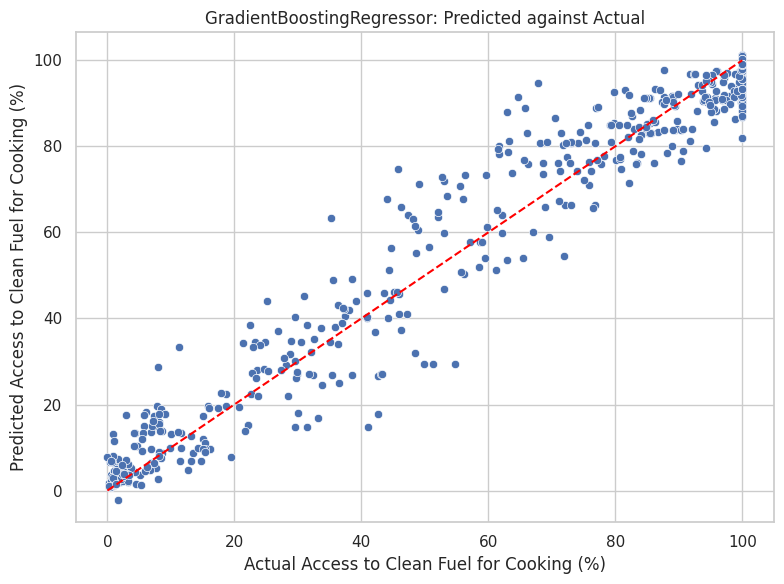

In [ ]:
# y_test: true values, y_pred: predicted values from GradientBoostingRegressor

def plot_predicted_actual_reg(y_pred, model_name = 'Model'):
  plt.figure(figsize=(8, 6))
  sns.scatterplot(x = y_reg_test, y = y_pred)
  plt.plot([y_reg_test.min(), y_reg_test.max()], [y_reg_test.min(), y_reg_test.max()], color='red', linestyle='--')
  plt.xlabel('Actual Access to Clean Fuel for Cooking (%)')
  plt.ylabel('Predicted Access to Clean Fuel for Cooking (%)')
  plt.title(f'{model_name}: Predicted against Actual')
  plt.tight_layout()
  plt.show()

plot_predicted_actual_reg(y_pred_gbr, 'GradientBoostingRegressor')

                                              Feature  Importance
7                    primary_energy_consum_per_capita    0.727292
1                                     access_elec_pct    0.163271
2          renew_energy_share_total_energy_consum_pct    0.033067
11                                     gdp_per_capita    0.020872
15                                          longitude    0.018762
14                                           latitude    0.012116
3                                    elec_fossil_fuel    0.006437
8                            primary_energy_intensity    0.003516
13                                          land_area    0.003351
12                                 population_density    0.002991
9                                       co2_emissions    0.002423
5                                     elec_renewables    0.001992
25  renew_energy_share_total_energy_consum_pct_mis...    0.001440
6                                 low_carbon_elec_pct    0.001097
10        

<ipython-input-290-2022020558>:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data = feature_importance_df.head(top_k), x = 'Importance', y = 'Feature', palette = 'viridis')


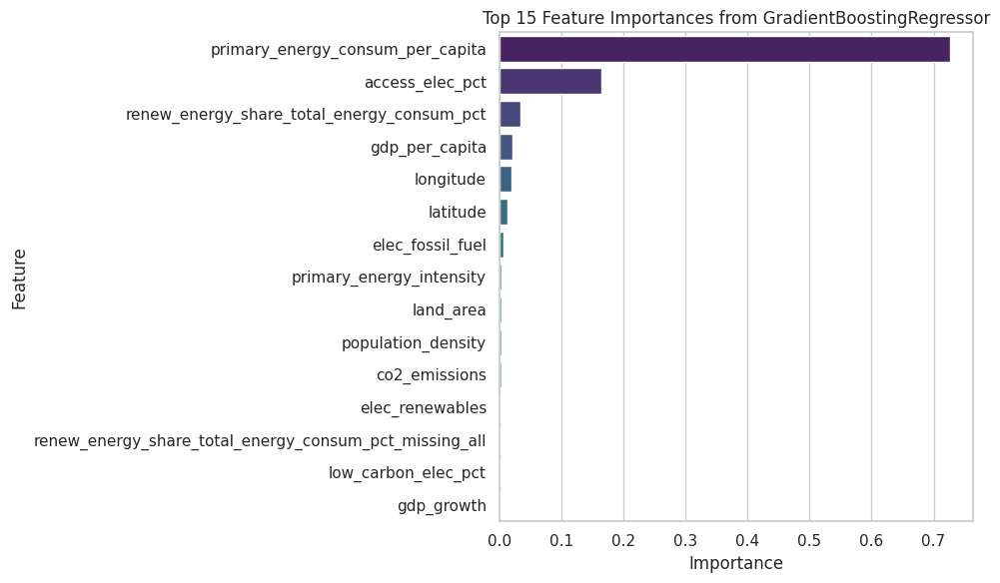

In [ ]:
def plot_reg_feature_importances(model, model_name = 'Model', top_k = 15):
  importances = model.feature_importances_

  feature_importance_df = pd.DataFrame({
      'Feature': x_reg_train.columns,
      'Importance': importances
  })

  # Sort by importance descending
  feature_importance_df = feature_importance_df.sort_values(by = 'Importance', ascending = False)

  # Display top features
  print(feature_importance_df.head(top_k))

  plt.figure(figsize = (10, 6))
  sns.barplot(data = feature_importance_df.head(top_k), x = 'Importance', y = 'Feature', palette = 'viridis')
  plt.title(f'Top {top_k} Feature Importances from {model_name}')
  plt.tight_layout()
  plt.show()

plot_reg_feature_importances(baseline_gbr, 'GradientBoostingRegressor', 15)

In [ ]:
# Hyperparameter tuning
# gbr_params = {
#     "n_estimators": [100, 200, 300],
#     "learning_rate": [0.01, 0.1, 0.2],
#     "max_depth": [3, 5, 7]
# }
# gbr_grid = GridSearchCV(
#     GradientBoostingRegressor(random_state=42),
#     gbr_params,
#     cv=5,
#     scoring="r2",
#     n_jobs=-1
# )
# gbr_grid.fit(x_reg_train_scaled, y_reg_train)
# best_params = gbr_grid.best_params_
# print("\nBest parameters:", best_params)
# Best parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 300}


Best parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 300}


## KNeighborsRegressor

In [ ]:
from sklearn.neighbors import KNeighborsRegressor

# Baseline model
baseline_knn = KNeighborsRegressor(n_neighbors = 5)
baseline_knn.fit(x_reg_train_scaled, y_reg_train)

y_pred_knn = baseline_knn.predict(x_reg_test_scaled)

evaluate_reg_output(y_pred_knn, model_name = "KNeighborsRegressor")

reg_cv_scores(baseline_knn, x_reg_train_scaled, y_reg_train)

KNeighborsRegressor Evaluation Metrics:

Mean Squared Error (MSE): 43.47927543103449
Root Mean Squared Error (RMSE): 6.593881666441588
R^2 Score (R^2): 0.9717787707486049

KNeighborsRegressor CV Mean MSE: 35.2652 ± 21.1175
KNeighborsRegressor CV Mean RMSE: 5.9385 ± 4.5954
KNeighborsRegressor CV Mean R^2 Score: 0.9764 ± 0.0148



In [ ]:
#Hyperparameter tuning
#knn_params = {
    #"n_neighbors": [3, 5, 7, 9, 11, 15, 20],
    #"weights": ["uniform", "distance"],
    #"metric": ["euclidean", "manhattan"]
#}
#knn_grid = GridSearchCV(
    #KNeighborsRegressor(),
    #knn_params,
    #cv=10,
    #scoring="r2",
    #n_jobs=-1
#)
#knn_grid.fit(x_reg_train_scaled, y_reg_train)
#best_params = knn_grid.best_params_
#print("\nBest parameters:", best_params)

## Support Vector Regressor

In [ ]:
from sklearn.svm import SVR

# Baseline model
baseline_svr = SVR(kernel = 'rbf', C = 1.0, epsilon = 0.1)
baseline_svr.fit(x_reg_train_scaled, y_reg_train)

y_pred_svr = baseline_svr.predict(x_reg_test_scaled)

evaluate_reg_output(y_pred_svr, model_name = "Support Vector Regressor")

reg_cv_scores(baseline_svr, x_reg_train_scaled, y_reg_train)

Support Vector Regressor Evaluation Metrics:

Mean Squared Error (MSE): 362.4521018201381
Root Mean Squared Error (RMSE): 19.038174855277965
R^2 Score (R^2): 0.764742080986588

SVR CV Mean MSE: 378.5703 ± 76.1984
SVR CV Mean RMSE: 19.4569 ± 8.7292
SVR CV Mean R^2 Score: 0.7478 ± 0.0504



In [ ]:
#Hyperparameter tuning
#svr_params = {
    #"C": [0.1, 1, 10, 100],
    #"epsilon": [0.01, 0.1, 0.2],
    #"kernel": ["linear", "rbf"],
    #"gamma": ["scale", "auto"]
#}
#svr_grid = GridSearchCV(
    #SVR(),
    #svr_params,
    #cv=10,
    #scoring="r2",
    #n_jobs=-1
#)
#svr_grid.fit(x_reg_train_scaled, y_reg_train)
#best_params = svr_grid.best_params_
#print("\nBest parameters:", best_params)

# Regression Model Evaluation

# Primary Energy Intensity Classification (Classification) Model-Building

Dataset: classification_df

Classes: 0 (Low), 1 (Medium), 2 (High)

For model training use:
x_class_train_scaled,
x_class_test scaled,
y_class_train,
y_class_test

### Classification Exploratory Data Analysis (EDA)

In [ ]:
classification_region_df.head(50)

,country,region,year,access_elec_pct,access_clean_fuel_cook,...,elec_fossil_fuel_missing,elec_fossil_fuel_missing_all,access_elec_pct_missing,access_elec_pct_missing_all,pei_class
0,Afghanistan,Southern Asia,2000,1.613591,6.20,...,0,0,0,0,0
1,Afghanistan,Southern Asia,2001,4.074574,7.20,...,0,0,0,0,0
2,Afghanistan,Southern Asia,2002,9.409158,8.20,...,0,0,0,0,0
3,Afghanistan,Southern Asia,2003,14.738506,9.50,...,0,0,0,0,0
4,Afghanistan,Southern Asia,2004,20.064968,10.90,...,0,0,0,0,0
5,Afghanistan,Southern Asia,2005,25.390894,12.20,...,0,0,0,0,0
6,Afghanistan,Southern Asia,2006,30.718690,13.85,...,0,0,0,0,0
7,Afghanistan,Southern Asia,2007,36.051010,15.30,...,0,0,0,0,0
8,Afghanistan,Southern Asia,2008,42.400000,16.70,...,0,0,0,0,0
9,Afghanistan,Southern Asia,2009,46.740050,18.40,...,0,0,0,0,0


In [ ]:
classification_region_df.dtypes

,0
country,object
region,object
year,int64
access_elec_pct,float64
access_clean_fuel_cook,float64
renew_energy_share_total_energy_consum_pct,float64
elec_fossil_fuel,float64
elec_nuclear,float64
elec_renewables,float64
low_carbon_elec_pct,float64


In [ ]:
classification_df

,year,access_elec_pct,access_clean_fuel_cook,renew_energy_share_total_energy_consum_pct,elec_fossil_fuel,...,elec_fossil_fuel_missing,elec_fossil_fuel_missing_all,access_elec_pct_missing,access_elec_pct_missing_all,pei_class
0,2000,1.613591,6.2,44.99,0.16,...,0,0,0,0,0
1,2001,4.074574,7.2,45.60,0.09,...,0,0,0,0,0
2,2002,9.409158,8.2,37.83,0.13,...,0,0,0,0,0
3,2003,14.738506,9.5,36.66,0.31,...,0,0,0,0,0
4,2004,20.064968,10.9,44.24,0.33,...,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
3643,2016,42.561730,29.8,81.90,3.50,...,0,0,0,0,2
3644,2017,44.178635,29.8,82.46,3.05,...,0,0,0,0,2
3645,2018,45.572647,29.9,80.23,3.73,...,0,0,0,0,2
3646,2019,46.781475,30.1,81.50,3.66,...,0,0,0,0,2


In [ ]:
classification_df.dtypes

,0
year,int64
access_elec_pct,float64
access_clean_fuel_cook,float64
renew_energy_share_total_energy_consum_pct,float64
elec_fossil_fuel,float64
elec_nuclear,float64
elec_renewables,float64
low_carbon_elec_pct,float64
primary_energy_consum_per_capita,float64
co2_emissions,float64


In [ ]:
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, accuracy_score

# Helper function to quickly output the metrics of a model based on its y_pred
def evaluate_class_output(y_pred):
  cm = confusion_matrix(y_class_test, y_pred)

  print("Confusion Matrix:")
  print(cm)

  print("\nClassification Report:\n")
  print(classification_report(y_class_test, y_pred, target_names = ['Low', 'Medium', 'High']))

  print("Accuracy Score:", accuracy_score(y_class_test, y_pred))

  disp = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = ['Low', 'Medium', 'High'])
  disp.plot(cmap = 'Blues')
  plt.grid(False)
  plt.title("Confusion Matrix")
  plt.xlabel("Predicted Primary Energy Intensity Class")
  plt.ylabel("True Primary Energy Intensity Class")
  plt.show()

# Cross-validation helper function for classification tasks
def perform_class_kfold_cv(model, k = 10, scoring = 'accuracy'):
  skf = StratifiedKFold(n_splits = k, shuffle = True, random_state = 22002548)

  cv_scores = cross_val_score(model, x_class_train_scaled, y_class_train, cv = skf, scoring = scoring)

  print("Cross-validation scores:", cv_scores)
  print("Mean CV accuracy:", np.mean(cv_scores))
  print("Standard deviation:", np.std(cv_scores))

# Helper function for tree-based models to show which columns are the most influential in classification
def plot_class_feature_importances(model, model_name = 'Model', top_k = 15):
  importances = model.feature_importances_

  feature_importance_df = pd.DataFrame({
      'Feature': x_class_train.columns,
      'Importance': importances
  })

  # Sort by importance descending
  feature_importance_df = feature_importance_df.sort_values(by = 'Importance', ascending = False)

  # Display top features
  print(feature_importance_df.head(top_k))

  plt.figure(figsize = (10, 6))
  sns.barplot(data = feature_importance_df.head(top_k), x = 'Importance', y = 'Feature', palette = 'viridis')
  plt.title(f'Top {top_k} Feature Importances from {model_name}')
  plt.tight_layout()
  plt.show()

# Define a function to plot missing vs. target variable by PEI class plot
def plot_missing_vs_target(missing_col):
  label_map = {0: 'Low', 1: 'Medium', 2: 'High'}

  func_df = classification_df.copy()

  func_df['target_label'] = func_df['pei_class'].map(label_map)

  plt.figure(figsize = (6, 4))
  sns.countplot(data = func_df, x = missing_col, hue = 'target_label', palette = 'Set2')
  plt.title(f"Class Distribution by {missing_col}")
  plt.xlabel(f"{missing_col} (0 = Not Missing, 1 = Missing)")
  plt.ylabel("Count")
  plt.legend(title = 'Class')
  plt.tight_layout()
  plt.show()

# Text version of above function
def print_missing_vs_target(missing_col):
  print(pd.crosstab(classification_df[missing_col], classification_df['pei_class'], rownames = ['Missing'], colnames = ['Class']))

In [ ]:
classification_df.dtypes

,0
year,int64
access_elec_pct,float64
access_clean_fuel_cook,float64
renew_energy_share_total_energy_consum_pct,float64
elec_fossil_fuel,float64
elec_nuclear,float64
elec_renewables,float64
low_carbon_elec_pct,float64
primary_energy_consum_per_capita,float64
co2_emissions,float64


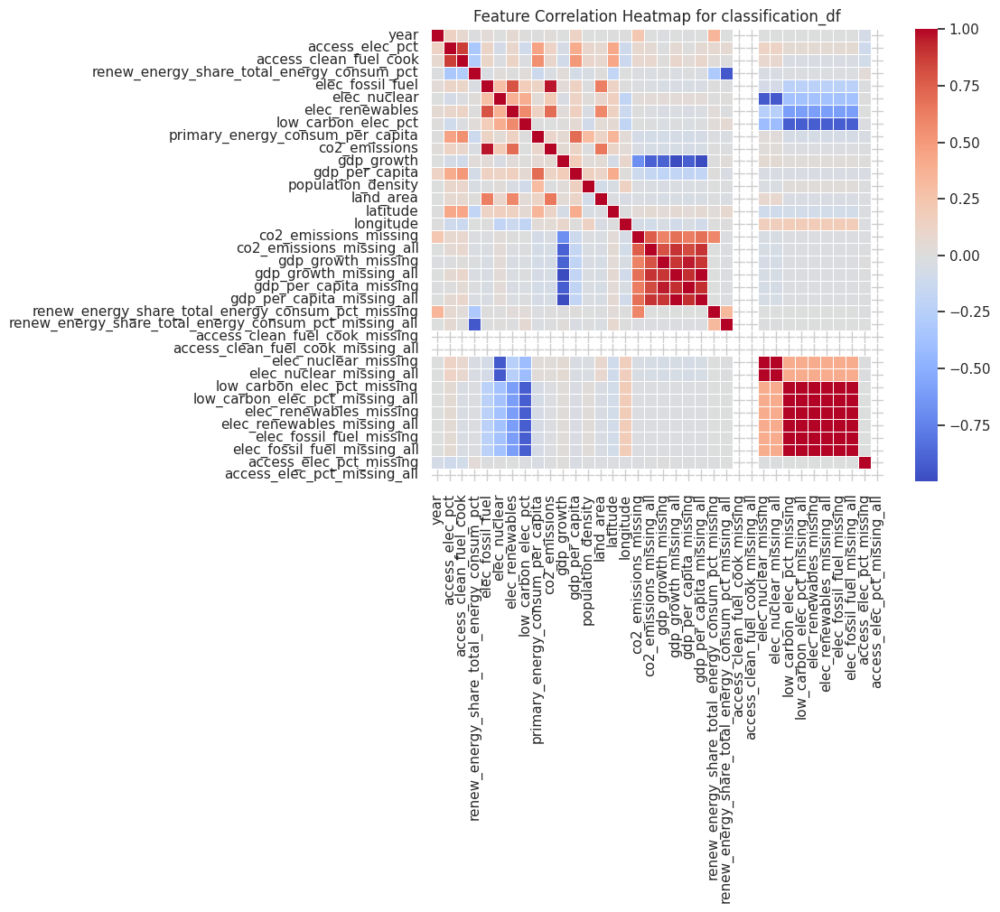

In [ ]:
# Drop the target variable for heat map
features_only = classification_df.drop(columns = ['pei_class'])

# Compute the correlation matrix
correlation_matrix = features_only.corr()

plt.figure(figsize = (12, 10))

# Create the heatmap
sns.heatmap(correlation_matrix, annot = False, fmt = ".2f", cmap = "coolwarm", square = True, linewidths = 0.5)

plt.title("Feature Correlation Heatmap for classification_df")
plt.tight_layout()

plt.show()

## Logistic Regression Classifier

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Initialise the Logistic Regression model
logreg = LogisticRegression(random_state = 22002548, max_iter = 1000)

# Train the model
logreg.fit(x_class_train_scaled, y_class_train)

# Make predictions on the testing set
y_pred = logreg.predict(x_class_test_scaled)

# Print evaluation metrics
evaluate_class_output(y_pred)

Confusion Matrix:
[[154  54  17]
 [ 53 114  60]
 [ 22  41 181]]

Classification Report:

              precision    recall  f1-score   support

         Low       0.67      0.68      0.68       225
      Medium       0.55      0.50      0.52       227
        High       0.70      0.74      0.72       244

    accuracy                           0.65       696
   macro avg       0.64      0.64      0.64       696
weighted avg       0.64      0.65      0.64       696

Accuracy Score: 0.6451149425287356


In [ ]:
perform_class_kfold_cv(logreg)

Cross-validation scores: [0.64516129 0.66666667 0.71326165 0.64516129 0.63309353 0.64388489
 0.64028777 0.64748201 0.62589928 0.64748201]
Mean CV accuracy: 0.6508380392460225
Standard deviation: 0.023088293864958007


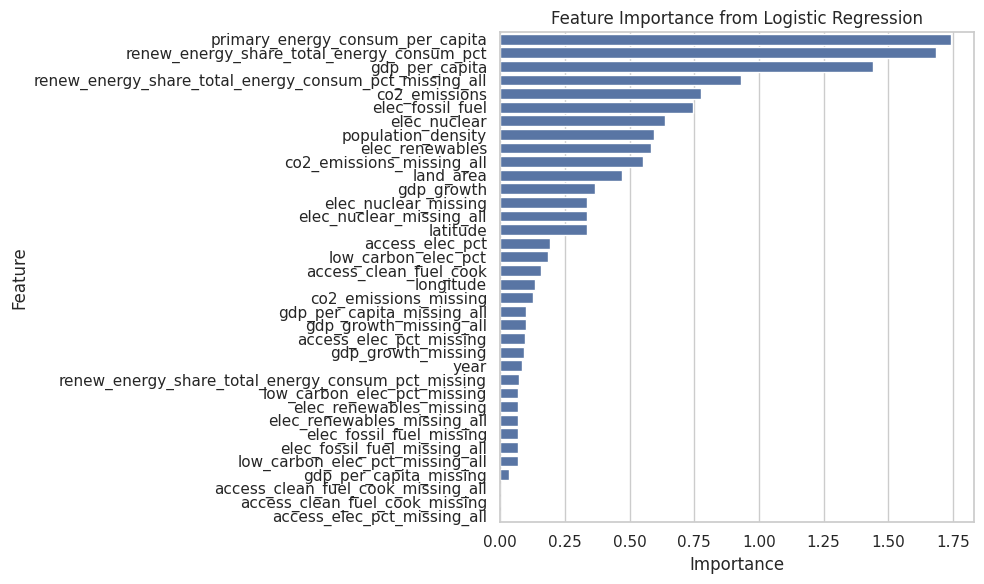

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Get the absolute value of coefficients
coefs = np.abs(logreg.coef_)

# If it's multiclass (e.g., 3 classes), you can take the mean importance across all classes
if coefs.shape[0] > 1:
    coefs = np.mean(np.abs(logreg.coef_), axis=0)
else:
    coefs = coefs.ravel()

# Get feature names
feature_names = x_class.columns

# Create DataFrame
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': coefs
}).sort_values(by='Importance', ascending=False)

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=importance_df)
plt.title("Feature Importance from Logistic Regression")
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

# Define the parameter grid to search
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],           # Regularization strength
    'solver': ['liblinear', 'lbfgs', 'saga'],      # Solvers for optimization
    'penalty': ['l2'],                             # Only 'l2' supported for most solvers
    'max_iter': [1000]                             # Increase if convergence warnings occur
}

# Set up the grid search
grid_search = GridSearchCV(LogisticRegression(random_state=22002548),
                           param_grid,
                           cv=10,
                           scoring='accuracy',
                           n_jobs=-1)

# Fit to the training data
grid_search.fit(x_class_train_scaled, y_class_train)

# Show best parameters and score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validated Accuracy:", grid_search.best_score_)

# Use the best model to predict
best_logreg = grid_search.best_estimator_
y_pred = best_logreg.predict(x_class_test_scaled)

# Evaluate results
evaluate_class_output(y_pred)


Best Parameters: {'C': 10, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'liblinear'}
Best Cross-Validated Accuracy: 0.6602086073077023
Confusion Matrix:
[[163  44  18]
 [ 65 101  61]
 [ 23  31 190]]

Classification Report:

              precision    recall  f1-score   support

         Low       0.65      0.72      0.68       225
      Medium       0.57      0.44      0.50       227
        High       0.71      0.78      0.74       244

    accuracy                           0.65       696
   macro avg       0.64      0.65      0.64       696
weighted avg       0.64      0.65      0.64       696

Accuracy Score: 0.6522988505747126


##Random Forest Classifier

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
# Initialise Random Forest classifier with random seed for reproducibility
rfc = RandomForestClassifier(random_state = 22002548)

# Train the model using scaled training features
rfc.fit(x_class_train_scaled, y_class_train)

RandomForestClassifier(random_state=22002548)

In [ ]:
y_pred_rfc = rfc.predict(x_class_test_scaled)

evaluate_class_output(y_pred_rfc)

Confusion Matrix:
[[211  14   0]
 [  7 210  10]
 [  0  12 232]]

Classification Report:

              precision    recall  f1-score   support

         Low       0.97      0.94      0.95       225
      Medium       0.89      0.93      0.91       227
        High       0.96      0.95      0.95       244

    accuracy                           0.94       696
   macro avg       0.94      0.94      0.94       696
weighted avg       0.94      0.94      0.94       696

Accuracy Score: 0.9382183908045977


In [ ]:
perform_class_kfold_cv(rfc)

Cross-validation scores: [0.90681004 0.89964158 0.91756272 0.90322581 0.92446043 0.91366906
 0.92446043 0.92086331 0.9352518  0.92086331]
Mean CV accuracy: 0.9166808488692917
Standard deviation: 0.010390218418649934


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score

# Pipeline
rfc_pipeline = Pipeline([("clf", RandomForestClassifier(random_state=42))])

# Hyperparameter space
rfc_random_param_dist = {
    "clf__n_estimators": [50, 100, 200, 300],
    "clf__max_depth": [None, 10, 20, 30, 50],
    "clf__min_samples_split": [2, 5, 10],
    "clf__min_samples_leaf": [1, 2, 4],
    "clf__bootstrap": [True, False]
}

# Randomized Search
rfc_random_search = RandomizedSearchCV(
    rfc_pipeline,
    param_distributions=rfc_random_param_dist,
    n_iter=20,
    cv=5,
    scoring="f1_weighted",
    random_state=42,
    n_jobs=-1
)

# Fit and predict
rfc_random_search.fit(x_class_train_scaled, y_class_train)
rfc_best_model = rfc_random_search.best_estimator_
rfc_y_pred = rfc_best_model.predict(x_class_test_scaled)

# Print performance
print("Random Forest Best Params:", rfc_random_search.best_params_)
evaluate_class_output(rfc_y_pred)


# cross-validation
# perform_class_kfold_cv(rfc_best_model)

# Random Forest Best Params: {'clf__n_estimators': 200, 'clf__min_samples_split': 2, 'clf__min_samples_leaf': 2, 'clf__max_depth': 30, 'clf__bootstrap': False}
# Confusion Matrix:
# [[212  13   0]
#  [  7 209  11]
#  [  0  10 234]]

# Classification Report:

#               precision    recall  f1-score   support

#          Low       0.97      0.94      0.95       225
#       Medium       0.90      0.92      0.91       227
#         High       0.96      0.96      0.96       244

#     accuracy                           0.94       696
#    macro avg       0.94      0.94      0.94       696
# weighted avg       0.94      0.94      0.94       696

# Accuracy Score: 0.9410919540229885
# Cross-validation scores: [0.91397849 0.91756272 0.91039427 0.91756272 0.92446043 0.91007194
#  0.92086331 0.9352518  0.93884892 0.92805755]
# Mean CV accuracy: 0.9217052164719839
# Standard deviation: 0.00939873447287719

Random Forest Best Params: {'clf__n_estimators': 200, 'clf__min_samples_split': 2, 'clf__min_samples_leaf': 2, 'clf__max_depth': 30, 'clf__bootstrap': False}
Confusion Matrix:
[[212  13   0]
 [  7 209  11]
 [  0  10 234]]

Classification Report:

              precision    recall  f1-score   support

         Low       0.97      0.94      0.95       225
      Medium       0.90      0.92      0.91       227
        High       0.96      0.96      0.96       244

    accuracy                           0.94       696
   macro avg       0.94      0.94      0.94       696
weighted avg       0.94      0.94      0.94       696

Accuracy Score: 0.9410919540229885
Cross-validation scores: [0.91397849 0.91756272 0.91039427 0.91756272 0.92446043 0.91007194
 0.92086331 0.9352518  0.93884892 0.92805755]
Mean CV accuracy: 0.9217052164719839
Standard deviation: 0.00939873447287719


Confusion Matrix:
[[208  17   0]
 [  6 210  11]
 [  0  13 231]]

Classification Report:

              precision    recall  f1-score   support

         Low       0.97      0.92      0.95       225
      Medium       0.88      0.93      0.90       227
        High       0.95      0.95      0.95       244

    accuracy                           0.93       696
   macro avg       0.93      0.93      0.93       696
weighted avg       0.93      0.93      0.93       696

Accuracy Score: 0.9324712643678161


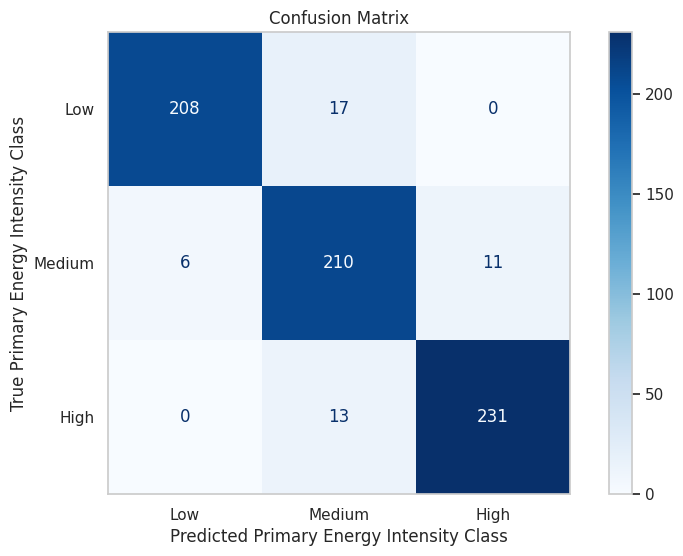

In [ ]:
best_rfc = RandomForestClassifier(n_estimators = 300, min_samples_split = 2, min_samples_leaf = 2, max_depth = 100, bootstrap = True, random_state = 22002548)
best_rfc.fit(x_class_train_scaled, y_class_train)

y_pred_best_rfc = best_rfc.predict(x_class_test_scaled)

evaluate_class_output(y_pred_best_rfc)

In [ ]:
perform_class_kfold_cv(best_rfc)

Cross-validation scores: [0.90322581 0.90681004 0.91039427 0.91397849 0.91726619 0.89928058
 0.92446043 0.92446043 0.93165468 0.92446043]
Mean CV accuracy: 0.9155991335963488
Standard deviation: 0.010111811181086375


                                       Feature  Importance
3   renew_energy_share_total_energy_consum_pct    0.115485
8             primary_energy_consum_per_capita    0.088295
15                                   longitude    0.077912
13                                   land_area    0.072277
11                              gdp_per_capita    0.071179
14                                    latitude    0.069977
9                                co2_emissions    0.066788
12                          population_density    0.063422
2                       access_clean_fuel_cook    0.060104
4                             elec_fossil_fuel    0.056687
6                              elec_renewables    0.055748
1                              access_elec_pct    0.048688
7                          low_carbon_elec_pct    0.048505
0                                         year    0.033737
10                                  gdp_growth    0.024487


<ipython-input-325-3419226575>:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data = feature_importance_df.head(top_k), x = 'Importance', y = 'Feature', palette = 'viridis')


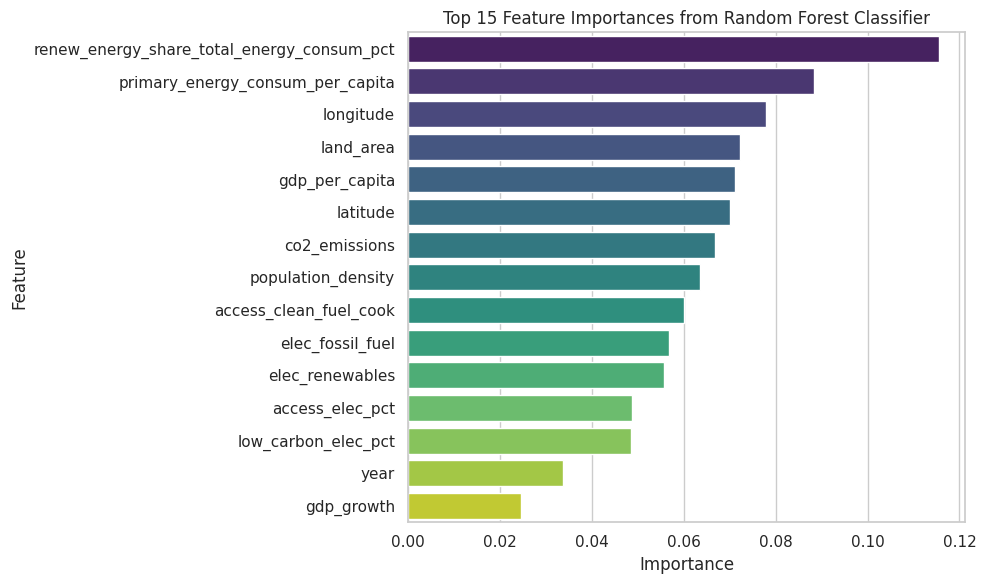

In [ ]:
plot_class_feature_importances(best_rfc, model_name='Random Forest Classifier', top_k=15)

### Suitability and Limitations of Random Forest Classifier (RFC)

Why we use Random Forest?  
Random Forest is ideal for classification problems involving tabular data and non-linear relationships. It’s an ensemble method that builds many decision trees and averages their results, which helps reduce overfitting and improve generalization.

Pros:
- Handles both linear and non-linear relationships well
- Works with both categorical and numerical features
- Resistant to overfitting (due to averaging across trees)
- Can handle missing data (to some extent)
- Feature importance is interpretable

Cons:
- Slower to train on large datasets
- Less interpretable than single decision trees
- Requires hyperparameter tuning for best performance
- Model size can be large with many estimators

## Gradient Boosting Classifier

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

# Initialise the Gradient Boosting Classifier
gbc = GradientBoostingClassifier(random_state = 22002548)

# Train the model
gbc.fit(x_class_train_scaled, y_class_train)

# Predict on the test set
y_pred = gbc.predict(x_class_test_scaled)

# Evaluation
print("Confusion Matrix:")
print(confusion_matrix(y_class_test, y_pred))

print("\nClassification Report:")
print(classification_report(y_class_test, y_pred, target_names = ['Low', 'Medium', 'High']))

print("Accuracy Score:", accuracy_score(y_class_test, y_pred))

Confusion Matrix:
[[202  23   0]
 [ 16 192  19]
 [  2  31 211]]

Classification Report:
              precision    recall  f1-score   support

         Low       0.92      0.90      0.91       225
      Medium       0.78      0.85      0.81       227
        High       0.92      0.86      0.89       244

    accuracy                           0.87       696
   macro avg       0.87      0.87      0.87       696
weighted avg       0.87      0.87      0.87       696

Accuracy Score: 0.8692528735632183


The accuracy is quite good! We'd ideally like to know which features/columns contribute most to the prediction. Fortunately, this is possible with tree-based models such as Gradient Boosting Classifier:

                                       Feature  Importance
3   renew_energy_share_total_energy_consum_pct    0.197825
8             primary_energy_consum_per_capita    0.131978
14                                    latitude    0.114510
15                                   longitude    0.111240
9                                co2_emissions    0.071381
11                              gdp_per_capita    0.066122
12                          population_density    0.064562
13                                   land_area    0.060567
6                              elec_renewables    0.041690
4                             elec_fossil_fuel    0.038667
5                                 elec_nuclear    0.028676
2                       access_clean_fuel_cook    0.024994
0                                         year    0.013170
7                          low_carbon_elec_pct    0.012885
1                              access_elec_pct    0.009129


<ipython-input-344-2696450697>:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data = feature_importance_df.head(top_k), x = 'Importance', y = 'Feature', palette = 'viridis')


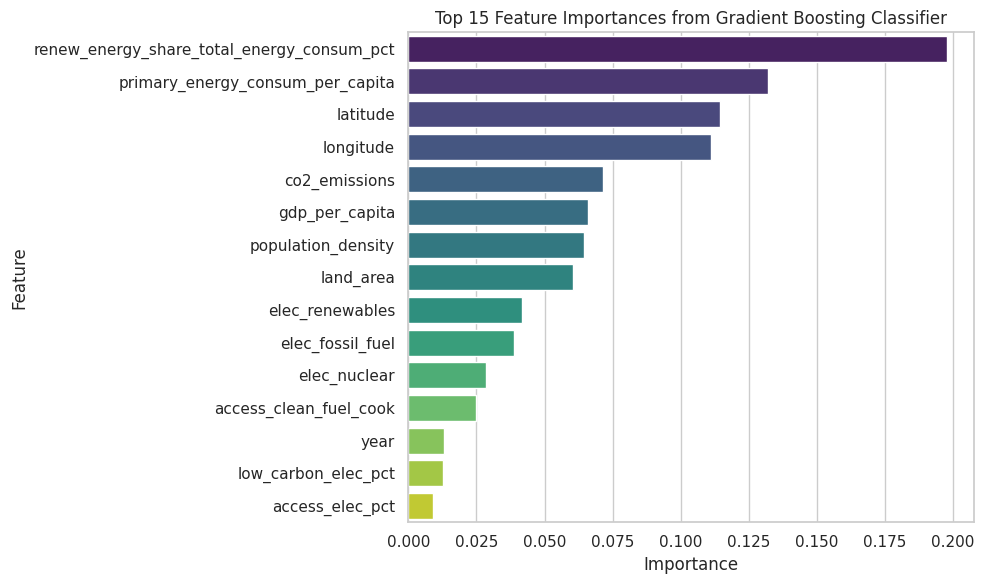

In [ ]:
plot_class_feature_importances(gbc, model_name = 'Gradient Boosting Classifier', top_k = 15)

In [ ]:
perform_class_kfold_cv(gbc)

Cross-validation scores: [0.87096774 0.85663082 0.87096774 0.88888889 0.86690647 0.85971223
 0.87410072 0.90647482 0.88848921 0.85611511]
Mean CV accuracy: 0.8739253758283695
Standard deviation: 0.015429160213703287


In [ ]:
from sklearn.model_selection import GridSearchCV

# # Define parameter grid
# gbc_param_grid = {
#     'n_estimators': [100, 150, 200],
#     'learning_rate': [0.01, 0.1, 0.2],
#     'max_depth': [3, 4, 5],
#     'subsample': [0.8, 1.0]
# }

# # Initialise base model
# gbc = GradientBoostingClassifier(random_state = 22002548)

# # Perform the grid search
# gbc_grid = GridSearchCV(gbc, gbc_param_grid, cv = 5, scoring = 'accuracy', n_jobs = -1)
# gbc_grid.fit(x_class_train_scaled, y_class_train)

# # Print the best model and its score
# print("Best Parameters:", gbc_grid.best_params_)
# print("Best CV Accuracy:", gbc_grid.best_score_)

# # Evaluate the best parameters on the test set
# best_gbc = gbc_grid.best_estimator_
# y_pred_gbc = best_gbc.predict(x_class_test_scaled)
# print("Test Accuracy:", accuracy_score(y_class_test, y_pred_gbc))

## XGBClassifier

In [ ]:
!pip install xgboost

In [ ]:
from xgboost import XGBClassifier

# Initialise XGBoost classifier
xgb = XGBClassifier(
    # New, tuned parameters
    colsample_bytree = 0.8,
    learning_rate = 0.1,
    max_depth = 5,
    n_estimators = 200,
    subsample = 0.8,
    # Original parameters
    objective = 'multi:softmax', # To predict class labels
    num_class = 3, # 3 classes in dataset
    use_label_encoder = False, # We used smoothed target encoding
    eval_metric = 'mlogloss', # Best suited for multiclass (more than 2) like the dataset
    random_state = 22002548
)

# Fit on training data
xgb.fit(x_class_train_scaled, y_class_train)

# Predict on test data
y_pred_xgb = xgb.predict(x_class_test_scaled)

# Evaluation
evaluate_class_output(y_pred_xgb)

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [10:58:48] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Confusion Matrix:
[[213  11   1]
 [ 10 210   7]
 [  0  15 229]]

Classification Report:

              precision    recall  f1-score   support

         Low       0.96      0.95      0.95       225
      Medium       0.89      0.93      0.91       227
        High       0.97      0.94      0.95       244

    accuracy                           0.94       696
   macro avg       0.94      0.94      0.94       696
weighted avg       0.94      0.94      0.94       696

Accuracy Score: 0.9367816091954023


In [ ]:
# 10-fold CV
perform_class_kfold_cv(xgb)

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [10:58:50] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [10:58:51] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [10:58:52] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [10:58:59] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [10:59:03] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_e

Cross-validation scores: [0.91397849 0.91039427 0.90322581 0.90681004 0.92086331 0.9028777
 0.90647482 0.92805755 0.92446043 0.91366906]
Mean CV accuracy: 0.913081147984838
Standard deviation: 0.008407863289019395


                                              Feature  Importance
20                             gdp_per_capita_missing    0.085685
17                          co2_emissions_missing_all    0.075805
3          renew_energy_share_total_energy_consum_pct    0.069342
15                                          longitude    0.067752
14                                           latitude    0.062139
13                                          land_area    0.055966
12                                 population_density    0.050540
5                                        elec_nuclear    0.047617
22  renew_energy_share_total_energy_consum_pct_mis...    0.046480
8                    primary_energy_consum_per_capita    0.046402
9                                       co2_emissions    0.044988
2                              access_clean_fuel_cook    0.043987
11                                     gdp_per_capita    0.040300
6                                     elec_renewables    0.033802
16        

<ipython-input-344-2696450697>:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data = feature_importance_df.head(top_k), x = 'Importance', y = 'Feature', palette = 'viridis')


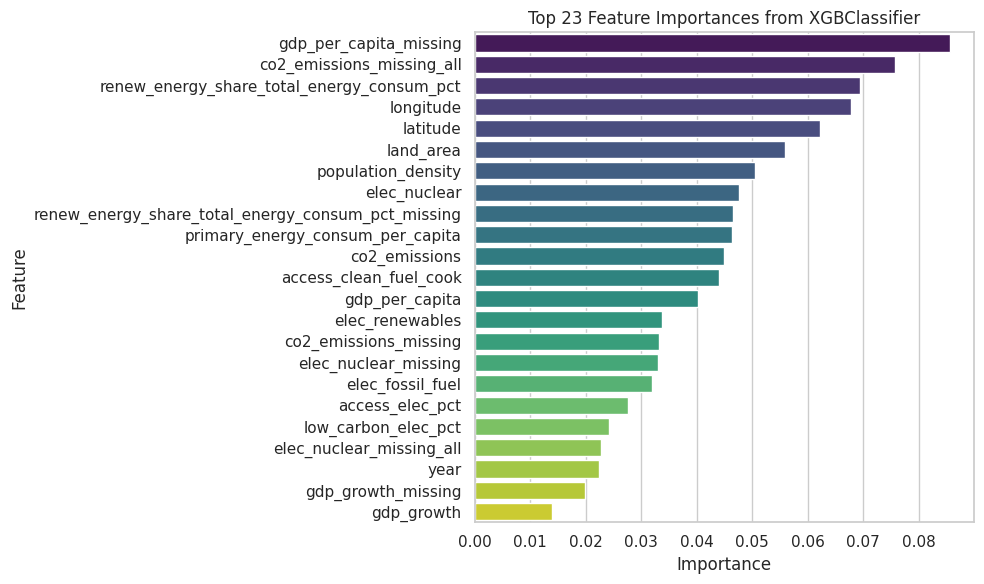

In [ ]:
plot_class_feature_importances(xgb, model_name = 'XGBClassifier', top_k = 23)

In [ ]:
# Define the base model
# xgb = XGBClassifier(device = 'cuda', random_state = 22002548, use_label_encoder = False, eval_metric = 'mlogloss')

# # Create the hyperparameter grid
# param_grid = {
#     'n_estimators': [100, 200],
#     'max_depth': [3, 5],
#     'learning_rate': [0.05, 0.1],
#     'subsample': [0.8, 1.0],
#     'colsample_bytree': [0.8, 1.0]
# }

# # Stratified 5-fold (less training time)
# cv = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 22002548)

# # Grid Search
# grid_search = GridSearchCV(estimator = xgb, param_grid = param_grid,
#                            scoring = 'accuracy', cv = cv, verbose = 1, n_jobs = -1)

# # Fit on training data
# grid_search.fit(x_class_train_scaled, y_class_train)

# # Best model and parameters
# print("Best Parameters:", grid_search.best_params_)
# print("Best Cross-Validation Score:", grid_search.best_score_)

# Results
# Best Parameters: {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8}
# Best Cross-Validation Score: 0.913793058910143

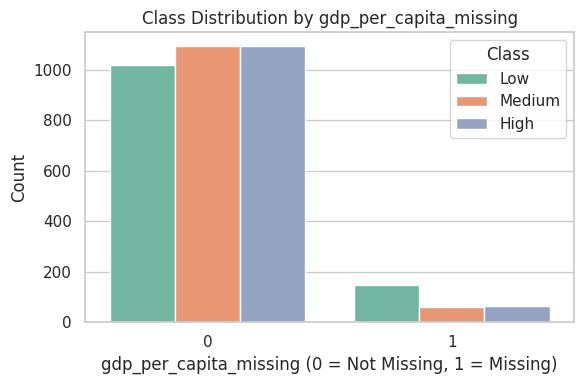

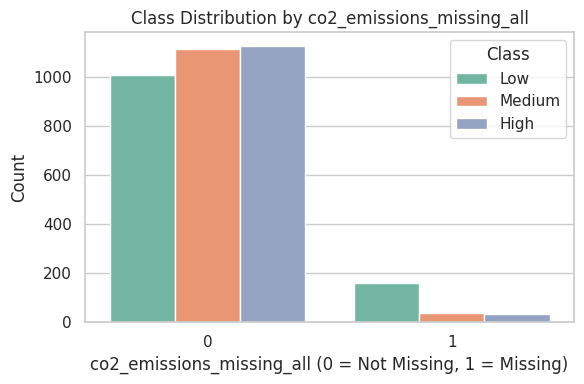

In [ ]:
plot_missing_vs_target('gdp_per_capita_missing')
plot_missing_vs_target('co2_emissions_missing_all')

In [ ]:
print_missing_vs_target('gdp_per_capita_missing')

Class       0     1     2
Missing                  
0        1021  1093  1094
1         147    60    65


In [ ]:
print_missing_vs_target('co2_emissions_missing_all')

Class       0     1     2
Missing                  
0        1007  1115  1127
1         161    38    32


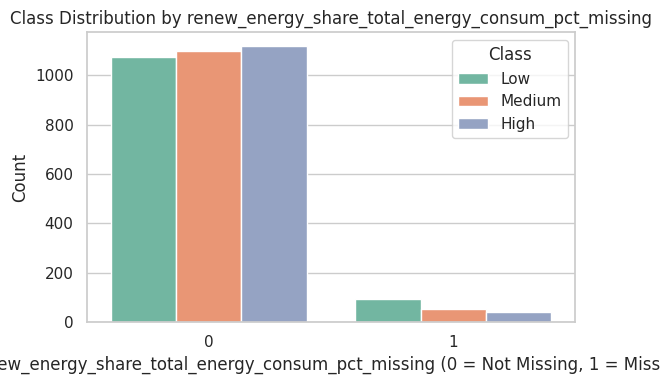

In [ ]:
plot_missing_vs_target('renew_energy_share_total_energy_consum_pct_missing')

##KNeighborsClassifier

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

In [ ]:
knn = KNeighborsClassifier(n_neighbors = 5)
knn.fit(x_class_train_scaled, y_class_train)

KNeighborsClassifier()

In [ ]:
y_pred = knn.predict(x_class_test_scaled)

In [ ]:
print("Confusion Matrix:")
print(confusion_matrix(y_class_test, y_pred))

print("\nClassification Report:")
print(classification_report(y_class_test, y_pred, target_names = ['Low', 'Medium', 'High']))

print("Accuracy Score:", accuracy_score(y_class_test, y_pred))

Confusion Matrix:
[[203  20   2]
 [ 19 194  14]
 [  5  27 212]]

Classification Report:
              precision    recall  f1-score   support

         Low       0.89      0.90      0.90       225
      Medium       0.80      0.85      0.83       227
        High       0.93      0.87      0.90       244

    accuracy                           0.88       696
   macro avg       0.88      0.88      0.88       696
weighted avg       0.88      0.88      0.88       696

Accuracy Score: 0.875


In [ ]:
perform_class_kfold_cv(knn)

Cross-validation scores: [0.8781362  0.86738351 0.84946237 0.87455197 0.89928058 0.88848921
 0.88489209 0.88489209 0.86690647 0.84892086]
Mean CV accuracy: 0.8742915345143241
Standard deviation: 0.01558216052391701


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score

# Pipeline
knn_pipeline = Pipeline([("clf", KNeighborsClassifier())])

# Hyperparameter grid
knn_param_grid = {
    "clf__n_neighbors": [3, 5, 7],
    "clf__weights": ["uniform", "distance"],
    "clf__metric": ["euclidean", "manhattan"]
}

# Grid Search
knn_grid = GridSearchCV(
    knn_pipeline,
    param_grid=knn_param_grid,
    cv=5,
    scoring="f1_weighted",
    n_jobs=-1
)

# Fit and predict
knn_grid.fit(x_class_train_scaled, y_class_train)
knn_best_model = knn_grid.best_estimator_
knn_y_pred = knn_best_model.predict(x_class_test_scaled)

# Output best params and accuracy
print("KNN Best Params:", knn_grid.best_params_)
evaluate_class_output(knn_y_pred)

# cross-validation
perform_class_kfold_cv(knn_best_model)

KNN Best Params: {'clf__metric': 'manhattan', 'clf__n_neighbors': 5, 'clf__weights': 'distance'}
Confusion Matrix:
[[206  17   2]
 [ 12 204  11]
 [  1  18 225]]

Classification Report:

              precision    recall  f1-score   support

         Low       0.94      0.92      0.93       225
      Medium       0.85      0.90      0.88       227
        High       0.95      0.92      0.93       244

    accuracy                           0.91       696
   macro avg       0.91      0.91      0.91       696
weighted avg       0.91      0.91      0.91       696

Accuracy Score: 0.9123563218390804
Cross-validation scores: [0.89605735 0.89605735 0.89964158 0.90322581 0.92446043 0.89208633
 0.90647482 0.91366906 0.91726619 0.88848921]
Mean CV accuracy: 0.9037428122018513
Standard deviation: 0.011053786284372738


### Suitability and Limitations of KNeighborsClassifier (KNC)

KNN is a simple and intuitive algorithm that classifies a sample based on the majority vote of its k-nearest neighbors in the feature space. It’s often used as a baseline model and can perform well with well-scaled and clean data.

Pros:
- Very easy to implement and understand
- No training phase — makes predictions directly from data
- Works well with smaller datasets
- Effective for problems with clear clusters

Cons:
- Performance degrades with high-dimensional data (curse of dimensionality)
- Sensitive to the choice of k and distance metric
- Slow prediction time on large datasets (since it stores all training data)
- Sensitive to feature scaling and noise


## Support Vector Classifier

In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Initialize SVC with a random state for reproducibility (if using a kernel with randomness)
svc = SVC(kernel = 'rbf',
          C = 10,
          gamma = 1,
          random_state = 22002548
      )

# Train the SVC on the scaled training data
svc.fit(x_class_train_scaled, y_class_train)

# Predict on the scaled test set
y_pred = svc.predict(x_class_test_scaled)

In [ ]:
perform_class_kfold_cv(svc)

Cross-validation scores: [0.90681004 0.88530466 0.88172043 0.91397849 0.91366906 0.89928058
 0.9028777  0.90647482 0.91366906 0.87769784]
Mean CV accuracy: 0.9001482684819886
Standard deviation: 0.01308986520464215


In [ ]:
# # Parameter grid
# param_grid = {
#     'C': [0.1, 1, 10],
#     'gamma': ['scale', 0.01, 0.1, 1]
# }

# # Initialise GridSearchCV with SVC
# svc = SVC()
# grid_search = GridSearchCV(
#     estimator = svc,
#     param_grid = param_grid,
#     cv = 5,
#     scoring = 'accuracy',
#     n_jobs = -1,
#     verbose = 2
# )

# # Fit using training data
# grid_search.fit(x_class_train_scaled, y_class_train)

# # Evaluate results
# print("Best Parameters:", grid_search.best_params_)
# print("Best Cross-Validation Accuracy:", grid_search.best_score_)

# # Predict and evaluate on testing set
# best_svc = grid_search.best_estimator_
# y_pred = best_svc.predict(x_class_test_scaled)

# print("\nConfusion Matrix:")
# print(confusion_matrix(y_class_test, y_pred))

# print("\nClassification Report:")
# print(classification_report(y_class_test, y_pred))

# Results
# Best Parameters: {'C': 10, 'gamma': 1}
# Best Cross-Validation Accuracy: 0.8947657672784572

## MLPClassifier

In [ ]:
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Initialize MLP Classifier (neural network)
mlp = MLPClassifier(hidden_layer_sizes=(100,),  # one hidden layer with 100 neurons
                    activation='logistic',          # activation function
                    solver='adam',              # optimization algorithm
                    max_iter=500,               # maximum iterations
                    random_state=22002548)

# Train the model
mlp.fit(x_class_train_scaled, y_class_train)

# Predict on test data
y_pred = mlp.predict(x_class_test_scaled)

# Evaluation
print("Confusion Matrix:")
print(confusion_matrix(y_class_test, y_pred))

print("\nClassification Report:")
print(classification_report(y_class_test, y_pred, target_names=['Low', 'Medium', 'High']))

print("Accuracy Score:", accuracy_score(y_class_test, y_pred))

Confusion Matrix:
[[196  24   5]
 [ 16 171  40]
 [  0  34 210]]

Classification Report:
              precision    recall  f1-score   support

         Low       0.92      0.87      0.90       225
      Medium       0.75      0.75      0.75       227
        High       0.82      0.86      0.84       244

    accuracy                           0.83       696
   macro avg       0.83      0.83      0.83       696
weighted avg       0.83      0.83      0.83       696

Accuracy Score: 0.8290229885057471


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


In [ ]:
perform_class_kfold_cv(mlp)

/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptro

Cross-validation scores: [0.79569892 0.81362007 0.78853047 0.8172043  0.79856115 0.83453237
 0.78057554 0.82374101 0.75899281 0.76978417]
Mean CV accuracy: 0.7981240813800572
Standard deviation: 0.0230790803883975


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform
from sklearn.neural_network import MLPClassifier

# Define parameter distributions for randomized search
param_dist = {
    'hidden_layer_sizes': [(100,), (100, 50), (128, 64)],
    'activation': ['logistic', 'relu', 'tanh'],
    'solver': ['adam', 'sgd'],
    'alpha': uniform(0.0001, 0.01),
    'learning_rate': ['constant', 'adaptive'],
    'max_iter': [500]
}

# Initialize base model
mlp = MLPClassifier(random_state=22002548)

# Randomized search with 20 iterations
mlp_random = RandomizedSearchCV(estimator=mlp,
                                 param_distributions=param_dist,
                                 n_iter=20,
                                 cv=10,
                                 scoring='accuracy',
                                 n_jobs=-1,
                                 random_state=42)

# Fit on training data
mlp_random.fit(x_class_train_scaled, y_class_train)

# Show best parameters and score
print("Best Parameters (RandomizedSearchCV):", mlp_random.best_params_)
print("Best CV Accuracy:", mlp_random.best_score_)

# Predict on test data
best_mlp = mlp_random.best_estimator_
y_pred = best_mlp.predict(x_class_test_scaled)
evaluate_class_output(y_pred)



# Classification Model Evaluation

# Deployment of Regression and Classification Models to Streamlit

# **The End!**